In [1]:
specie = 'leptocybe-invasa' # 'thaumastocoris-peregrinus' # 
training = 'east-asia' 
interest = 'south-east-asia'

count = 10000
# 100m ~ 0.001 deg
# 1000m ~ 0.01 deg
ref_res = (0.01, 0.01) # deg

region_train = 'east-asia' # 'all' #  'south-east-asia' # 
region_test = 'south-east-asia' # 'east-asia' # 'south-east-asia' # 

pseudoabsence = 'random' # 'biased-land-cover' # 'biased' # 'random' # 
bioclim = [i for i in range(1,20)] #[1,12] #[1, 5, 6, 12, 13, 14]# [1, 16, 6, 11] # [1,3,6,7,15,16] # 

year0 = 1981
year1 = 2023

savefig = True
topo1 = True

#---------------------
#Run for Future
Future = True
Scenario = 'C6-BCC-CSM2'

year000 = 2030
year111 = 2032


In [2]:
# initiate the dask cluster
from dask.distributed import LocalCluster

cluster = LocalCluster(dashboard_address=35779)

client = cluster.get_client()

/opt/anaconda3/envs/aciar/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 35779 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43411 instead
  warnings.warn(


In [2]:
%run '00_data-preparation.ipynb'

         lat         lon                 date source References  Elevation (m)
0 -37.741471  144.918649  2023-07-12T13:02:00   GBIF        NaN            NaN
1  43.192550     5.61277  2017-02-19T00:00:00   GBIF        NaN            NaN
2  43.671210     7.20069  2017-11-22T00:00:00   GBIF        NaN            NaN
3  43.192550     5.61277  2017-02-19T00:00:00   GBIF        NaN            NaN
4  40.593751    8.167206  2022-05-21T00:00:00   GBIF        NaN            NaN
Number of occurences globally is: 2081


Number of occurences globally is: 2081


,Unnamed: 0,lat,lon,date,source,References,Elevation (m)
0,0,-37.741471,144.918649,2023-07-12T13:02:00,GBIF,NaN,NaN
1,1,43.192550,5.61277,2017-02-19T00:00:00,GBIF,NaN,NaN
2,2,43.671210,7.20069,2017-11-22T00:00:00,GBIF,NaN,NaN
3,3,43.192550,5.61277,2017-02-19T00:00:00,GBIF,NaN,NaN
4,4,40.593751,8.167206,2022-05-21T00:00:00,GBIF,NaN,NaN
...,...,...,...,...,...,...,...
2076,25,11.750000,106.92,NaN,SE Asia,NaN,NaN
2077,26,19.420000,103.5,NaN,SE Asia,NaN,NaN
2078,27,17.980000,102.63,NaN,SE Asia,NaN,NaN
2079,28,7.480000,80.65,NaN,SE Asia,NaN,NaN


Number of occurences globally after removing occurrences without coordinates: 1103


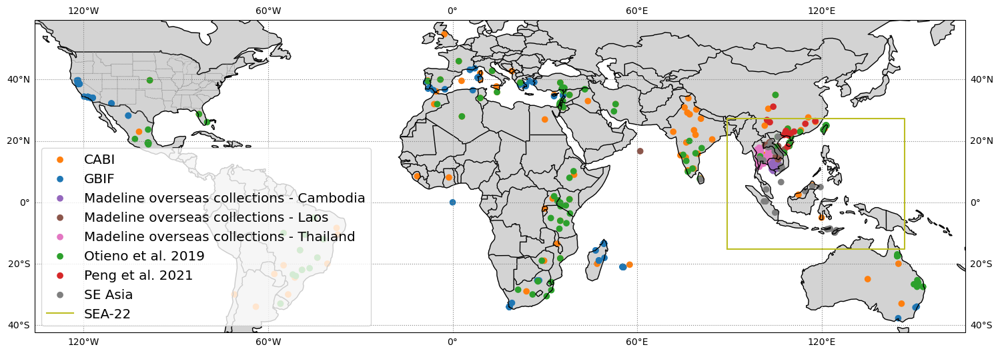

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,ADM0_A3,GEOU_DIF,GEOUNIT,GU_A3,SU_DIF,SUBUNIT,SU_A3,BRK_DIFF,NAME,NAME_LONG,BRK_A3,BRK_NAME,BRK_GROUP,ABBREV,POSTAL,FORMAL_EN,FORMAL_FR,NAME_CIAWF,NOTE_ADM0,NOTE_BRK,NAME_SORT,NAME_ALT,MAPCOLOR7,MAPCOLOR8,MAPCOLOR9,MAPCOLOR13,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,ECONOMY,INCOME_GRP,FIPS_10,ISO_A2,ISO_A2_EH,ISO_A3,ISO_A3_EH,ISO_N3,ISO_N3_EH,UN_A3,WB_A2,WB_A3,WOE_ID,WOE_ID_EH,WOE_NOTE,ADM0_ISO,ADM0_DIFF,ADM0_TLC,ADM0_A3_US,ADM0_A3_FR,ADM0_A3_RU,ADM0_A3_ES,ADM0_A3_CN,ADM0_A3_TW,ADM0_A3_IN,ADM0_A3_NP,ADM0_A3_PK,ADM0_A3_DE,ADM0_A3_GB,ADM0_A3_BR,ADM0_A3_IL,ADM0_A3_PS,ADM0_A3_SA,ADM0_A3_EG,ADM0_A3_MA,ADM0_A3_PT,ADM0_A3_AR,ADM0_A3_JP,ADM0_A3_KO,ADM0_A3_VN,ADM0_A3_TR,ADM0_A3_ID,ADM0_A3_PL,ADM0_A3_GR,ADM0_A3_IT,ADM0_A3_NL,ADM0_A3_SE,ADM0_A3_BD,ADM0_A3_UA,ADM0_A3_UN,ADM0_A3_WB,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_LEN,LONG_LEN,ABBREV_LEN,TINY,HOMEPART,MIN_ZOOM,MIN_LABEL,MAX_LABEL,LABEL_X,LABEL_Y,NE_ID,WIKIDATAID,NAME_AR,NAME_BN,NAME_DE,NAME_EN,NAME_ES,NAME_FA,NAME_FR,NAME_EL,NAME_HE,NAME_HI,NAME_HU,NAME_ID,NAME_IT,NAME_JA,NAME_KO,NAME_NL,NAME_PL,NAME_PT,NAME_RU,NAME_SV,NAME_TR,NAME_UK,NAME_UR,NAME_VI,NAME_ZH,NAME_ZHT,FCLASS_ISO,TLC_DIFF,FCLASS_TLC,FCLASS_US,FCLASS_FR,FCLASS_RU,FCLASS_ES,FCLASS_CN,FCLASS_TW,FCLASS_IN,FCLASS_NP,FCLASS_PK,FCLASS_DE,FCLASS_GB,FCLASS_BR,FCLASS_IL,FCLASS_PS,FCLASS_SA,FCLASS_EG,FCLASS_MA,FCLASS_PT,FCLASS_AR,FCLASS_JP,FCLASS_KO,FCLASS_VN,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
195,Admin-0 country,3,2,China,CH1,1,2,Country,1,China,CHN,0,China,CHN,0,China,CHN,0,China,China,CHN,China,NaN,China,CN,People's Republic of China,NaN,China,NaN,NaN,China,NaN,4,4,4,3,1.397715e+09,18,2019,14342903,2019,3. Emerging region: BRIC,3. Upper middle income,CH,CN,CN,CHN,CHN,156,156,156,CN,CHN,23424781,23424781,Exact WOE match as country,CHN,NaN,CHN,CHN,CHN,CHN,CHN,CHN,TWN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,CHN,-99,-99,Asia,Asia,Eastern Asia,East Asia & Pacific,5,5,5,-99,1,0.0,1.7,5.7,106.337289,32.498178,1159320471,Q148,الصين,গণচীন,Volksrepublik China,People's Republic of China,China,جمهوری خلق چین,République populaire de Chine,Λαϊκή Δημοκρατία της Κίνας,הרפובליקה העממית של סין,चीनी जनवादी गणराज्य,Kína,Republik Rakyat Tiongkok,Cina,中華人民共和国,중화인민공화국,Volksrepubliek China,Chińska Republika Ludowa,China,Китайская Народная Республика,Kina,Çin Halk Cumhuriyeti,Китайська Народна Республіка,عوامی جمہوریہ چین,Trung Quốc,中华人民共和国,中華人民共和國,Admin-0 country,NaN,Admin-0 country,NaN,NaN,NaN,NaN,NaN,Unrecognized,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((118.18301 24.49629, 118.14951 ..."
45,Admin-0 country,1,3,Taiwan,TWN,0,2,Sovereign country,1,Taiwan,TWN,0,Taiwan,TWN,0,Taiwan,TWN,0,Taiwan,Taiwan,TWN,Taiwan,NaN,Taiwan,TW,NaN,NaN,Taiwan,NaN,Self admin.; Claimed by China,Taiwan,NaN,1,5,7,2,2.356838e+07,15,2020,1127000,2016,2. Developed region: nonG7,2. High income: nonOECD,TW,CN-TW,TW,TWN,TWN,158,158,-099,-99,-99,23424971,23424971,Exact WOE match as country,TWN,NaN,TWN,TWN,TWN,CHN,TWN,CHN,TWN,TWN,CHN,CHN,TWN,TWN,TWN,TWN,TWN,TWN,CHN,CHN,TWN,TWN,TWN,TWN,TWN,TWN,CHN,TWN,TWN,TWN,TWN,TWN,CHN,TWN,-99,-99,Asia,Asia,Eastern Asia,East Asia & Pacific,6,6,6,-99,1,0.0,4.5,8.0,120.868204,23.652408,1159321335,Q865,تايوان,তাইওয়ান,Republik China,Taiwan,República de China,تایوان,Taïwan,Δημοκρατία της Κίνας,טאיוואן,चीनी गणराज्य,Kínai Köztársaság,Taiwan,Taiwan,中華民国,중화민국,Taiwan,Republika Chińska,Taiwan,Тайвань,Taiwan,Çin Cumhuriyeti,Республіка Китай,تائیوان,Đài Loan,中华民国,中華民國,Admin-1 states provinces,1,Admin-0 country,NaN,NaN,NaN,NaN,Admin-1 states provinces,Admin-0 country,NaN,Admin-1 states provinces,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Admin-1 states provinces,Admin-1 states provinces,NaN,NaN,NaN,NaN,NaN,NaN,Admin-1 states provinces,NaN,NaN,NaN,NaN,NaN,Admin-1 states provinces,NaN,"MULTIPOLYGON ((

Number of occurences in east-asia is: 36
['Australia' 'France' nan 'Italy' 'Portugal' 'South Africa'
 'United States of America' 'Madagascar' 'Spain' 'Greece' 'Cyprus'
 'Mexico' 'Kenya' 'Algeria' 'Israel' 'Egypt' 'Ethiopia' 'Ghana' 'Malawi'
 'Mauritius' 'Morocco' 'Mozambique' 'Rwanda' 'Sierra Leone'
 'United Republic of Tanzania' 'Tunisia' 'Uganda' 'Zimbabwe' 'Cambodia'
 'China' 'India' 'Indonesia' 'Iran' 'Iraq' 'Jordan' 'Laos' 'Malaysia'
 'Sri Lanka' 'Syria' 'Taiwan' 'Thailand' 'Turkey' 'Vietnam' 'Malta'
 'Montenegro' 'United Kingdom' 'Argentina' 'Brazil' 'Chile' 'Paraguay'
 'Uruguay']


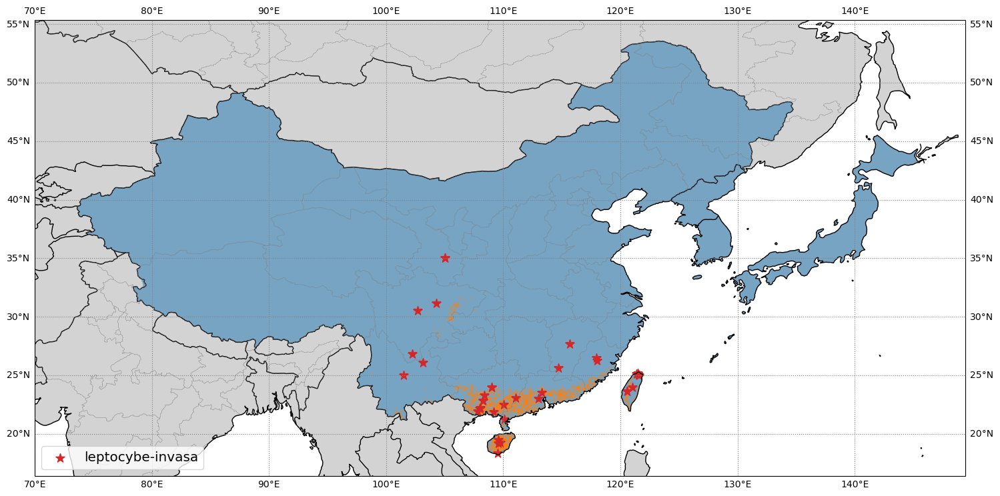

Number of occurences in south-east-asia is: 695


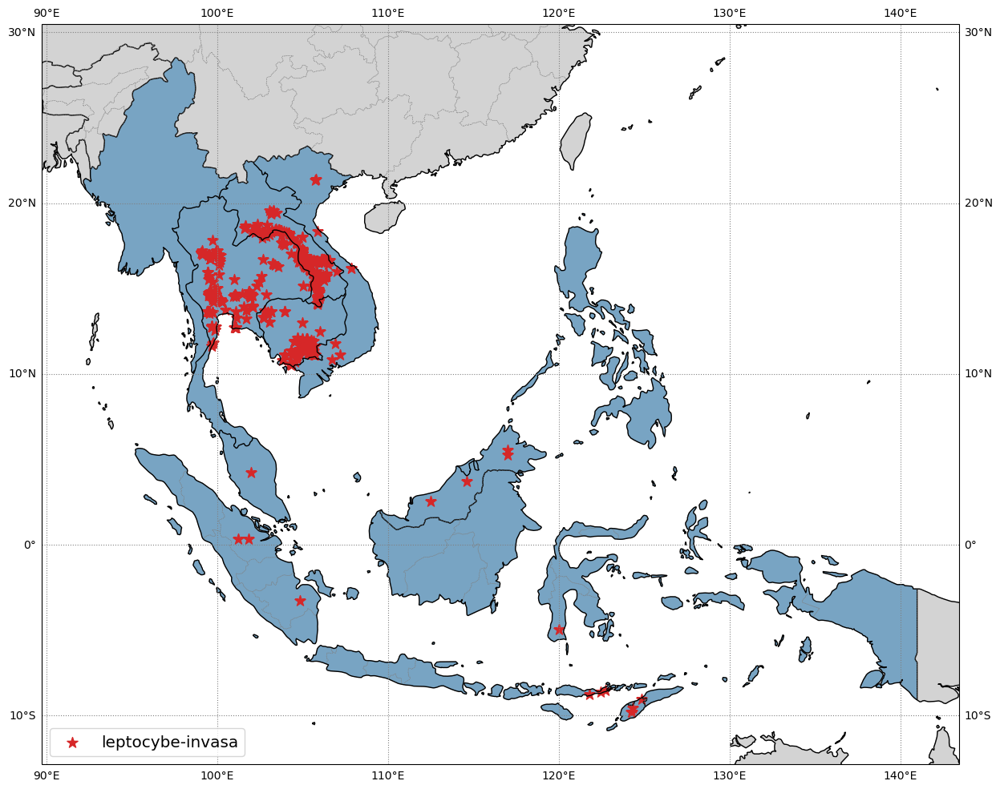

In [3]:
%run '01_specie-distribution.ipynb'

load presence
random
Number of presences in all is: 379
Number of random selected background points in all is: 10000
Number of presences in south-east-asia is: 695
Number of random selected background points in south-east-asia is: 10000


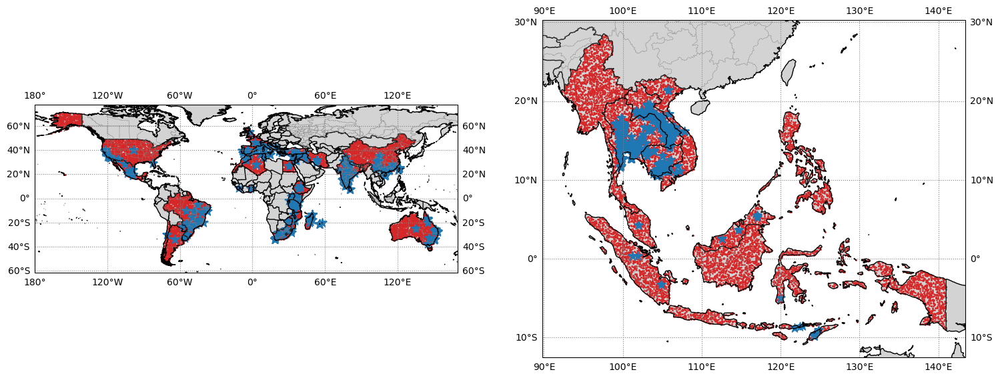

2.1
all
raster opened
land_cover_box
lcb_path_and_dir_created
land_cover_box_to_raster_done
south-east-asia
raster opened
land_cover_box
lcb_path_and_dir_created
land_cover_box_to_raster_done
regrid regional datasets to coarser grid
forest type land cover dataset
Weighted values:
Unknown : 0
Evergreen Needleleaf Forest : 0.8
Evergreen Broadleaf Forest : 1.0
Deciduous Needleleaf Forest : 0.2
Deciduous Broadleaf Forest : 0.4
Mixed Forest : 0.5
Number of presences in all is: 379
Number of random selected background points in all is: 10000
Number of presences in south-east-asia is: 695
Number of random selected background points in south-east-asia is: 10000


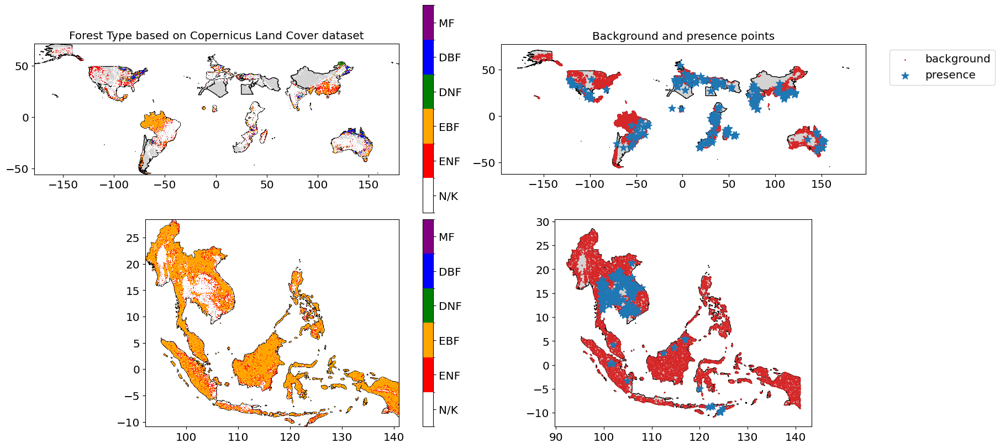

Number of presences in all is: 379
Number of background points with a bias towards forests in all is: 10000


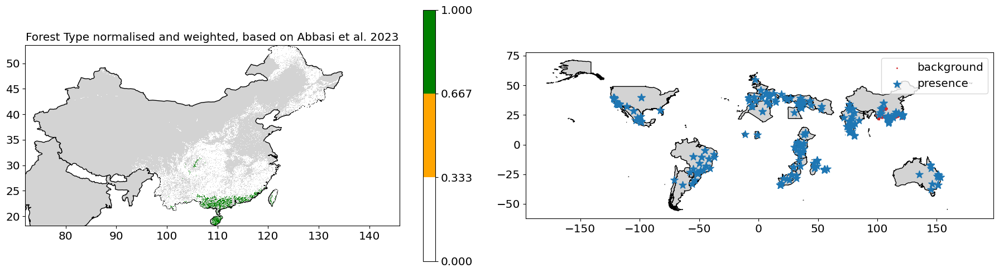

In [5]:
%run '02_pseudo-absence.ipynb'

srtm region save


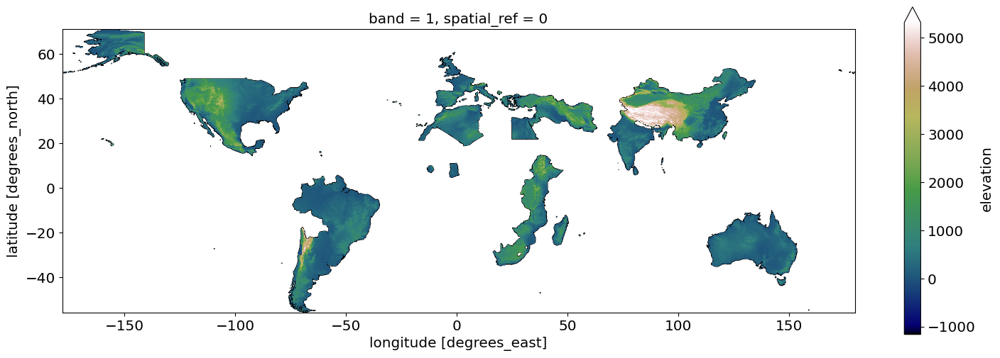

nvdi_nc loaded
ndvi_median saved
Tmax
Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop' exists. Deleting it.
Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop' created.
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1981.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1982.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1983.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1984.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1985.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/tmax_crop/TerraClimate_tmax_1986.nc
Cropped and saved: /scratch/gito_aciar

In [3]:
%run '03a_predictive-variables.ipynb'

Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/bioclim' does not exist.
Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/selected_year_train' does not exist.
Wed Apr  2 18:26:57 2025 select data
Wed Apr  2 18:40:52 2025 calculate seasonal data: precipitation
Wed Apr  2 18:46:49 2025 calculate seasonal data: temperature
Wed Apr  2 18:56:44 2025 remap temperature data
Wed Apr  2 19:25:26 2025 bioclim 1: annual mean temperature
Wed Apr  2 19:28:45 2025 bioclim 2: annual mean diurnal range
Wed Apr  2 19:35:03 2025 bioclim 4: temperature seasonality (standard deviation)
Wed Apr  2 19:38:42 2025 bioclim 5: max temperature of warmest month
Wed Apr  2 19:41:58 2025 bioclim 6: min temperature of coldest month
Wed Apr  2 19:45:10 2025 bioclim 7: annual temperature range
Wed Apr  2 19:45:36 2025 bioclim 3: isothermality
Wed Apr  2 19:46:07 2025 bioclim 8: mean temperature of wettest quarter
Wed Apr  2 19:46:07 2025 bioclim 8: 1981
Wed Apr  2

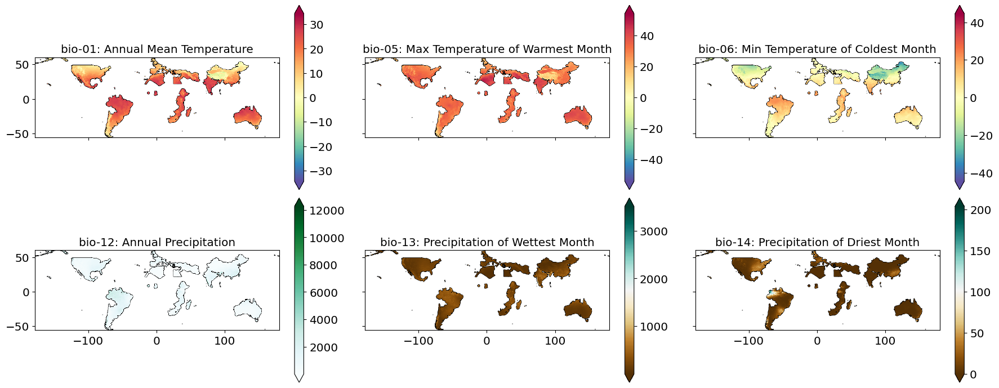

In [4]:
%run '03a_Bioclim_Training.ipynb'

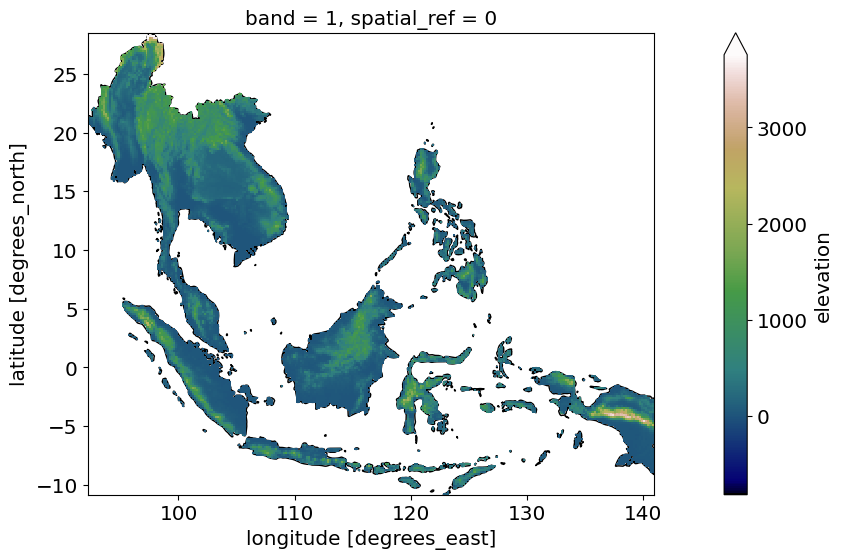

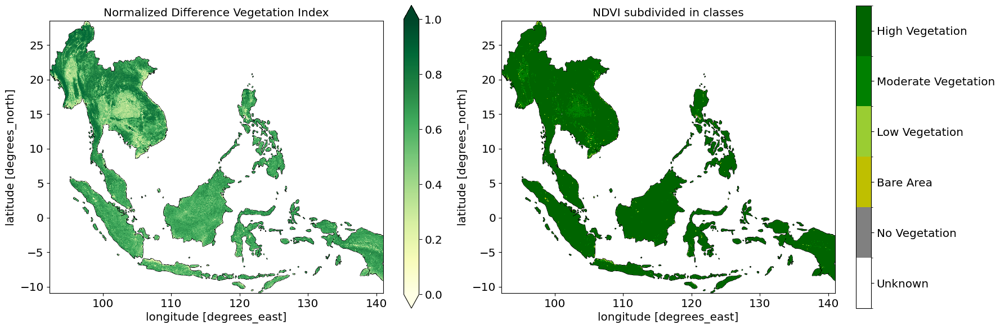

Tmax
Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop' created.
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1981.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1982.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1983.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1984.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1985.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1986.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmax_crop/TerraClimate_tmax_1987.nc
Cropped and saved: /scratch/gito_aciar/sdm-toolbox/out/leptocybe-in

In [2]:
%run '03_predictive-variables.ipynb'

Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/bioclim' does not exist.
Directory '/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/selected_year_test' does not exist.
Wed Apr  2 23:02:15 2025 select data
Wed Apr  2 23:03:04 2025 calculate seasonal data: precipitation
Wed Apr  2 23:03:26 2025 calculate seasonal data: temperature
Wed Apr  2 23:03:58 2025 remap temperature data
/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/test/tmp/tasmax-rem.nc
Wed Apr  2 23:05:03 2025 bioclim 1: annual mean temperature
Wed Apr  2 23:05:10 2025 bioclim 2: annual mean diurnal range
Wed Apr  2 23:05:21 2025 bioclim 4: temperature seasonality (standard deviation)
Wed Apr  2 23:05:29 2025 bioclim 5: max temperature of warmest month
Wed Apr  2 23:05:36 2025 bioclim 6: min temperature of coldest month
Wed Apr  2 23:05:42 2025 bioclim 7: annual temperature range
Wed Apr  2 23:05:43 2025 bioclim 3: isothermality
Wed Apr  2 23:05:44 2025 bioclim 8: mean tem

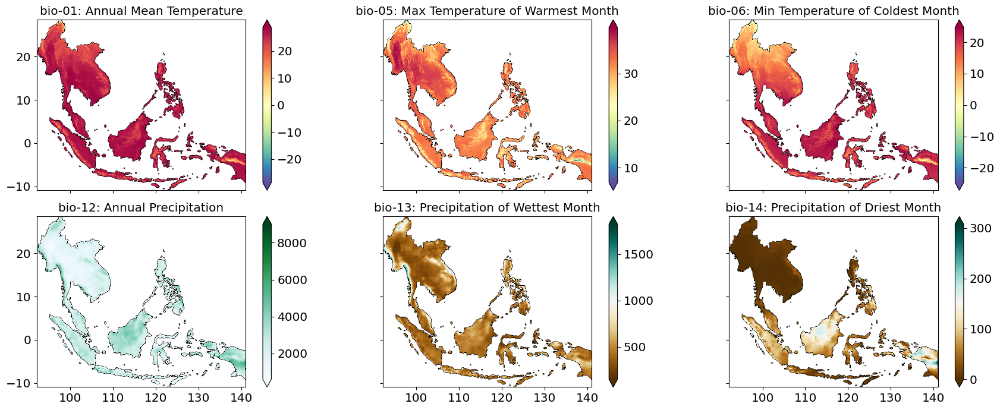

In [3]:
%run '03_Bioclim_Test.ipynb'

In [17]:
# # training = region_train 
# # %run '04_variable-statistics.ipynb'
# # import rasterio
# # Open the TIFF file
# tif_path = "/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/worldclim_train/bio_9.tif"
# with rasterio.open(tif_path) as dataset:
#     print("Width:", dataset.width)
#     print("Height:", dataset.height)
#     print("Number of Bands:", dataset.count)
#     print("Coordinate Reference System (CRS):", dataset.crs)
#     print("Bounds:", dataset.bounds)
#     print("Dtype:", dataset.dtypes)
#     print("Transform:", dataset.transform)


# tif_path = "/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/worldclim_train/bio_12.tif"
# with rasterio.open(tif_path) as dataset:
#     print("Width:", dataset.width)
#     print("Height:", dataset.height)
#     print("Number of Bands:", dataset.count)
#     print("Coordinate Reference System (CRS):", dataset.crs)
#     print("Bounds:", dataset.bounds)
#     print("Dtype:", dataset.dtypes)
#     print("Transform:", dataset.transform)

# tif_path = "/scratch/gito_aciar/sdm-toolbox/out/leptocybe-invasa/input/train/srtm_all.tif"
# with rasterio.open(tif_path) as dataset:
#     print("Width:", dataset.width)
#     print("Height:", dataset.height)
#     print("Number of Bands:", dataset.count)
#     print("Coordinate Reference System (CRS):", dataset.crs)
#     print("Bounds:", dataset.bounds)
#     print("Dtype:", dataset.dtypes)
#     print("Transform:", dataset.transform)

Width: 7159
Height: 2318
Number of Bands: 1
Coordinate Reference System (CRS): EPSG:4326
Bounds: BoundingBox(left=-178.20000305239734, bottom=59.99999847379181, right=179.7500061041551, top=-55.89999999967072)
Dtype: ('float32',)
Transform: | 0.05, 0.00,-178.20|
| 0.00, 0.05,-55.90|
| 0.00, 0.00, 1.00|
Width: 7159
Height: 2318
Number of Bands: 1
Coordinate Reference System (CRS): EPSG:4326
Bounds: BoundingBox(left=-178.20000305239734, bottom=59.99999847379181, right=179.7500061041551, top=-55.89999999967072)
Dtype: ('float32',)
Transform: | 0.05, 0.00,-178.20|
| 0.00, 0.05,-55.90|
| 0.00, 0.00, 1.00|
Width: 7159
Height: 2318
Number of Bands: 1
Coordinate Reference System (CRS): EPSG:4326
Bounds: BoundingBox(left=-178.20000305239734, bottom=59.99999847379181, right=179.7500061041551, top=-55.89999999967072)
Dtype: ('int16',)
Transform: | 0.05, 0.00,-178.20|
| 0.00, 0.05,-55.90|
| 0.00, 0.00, 1.00|


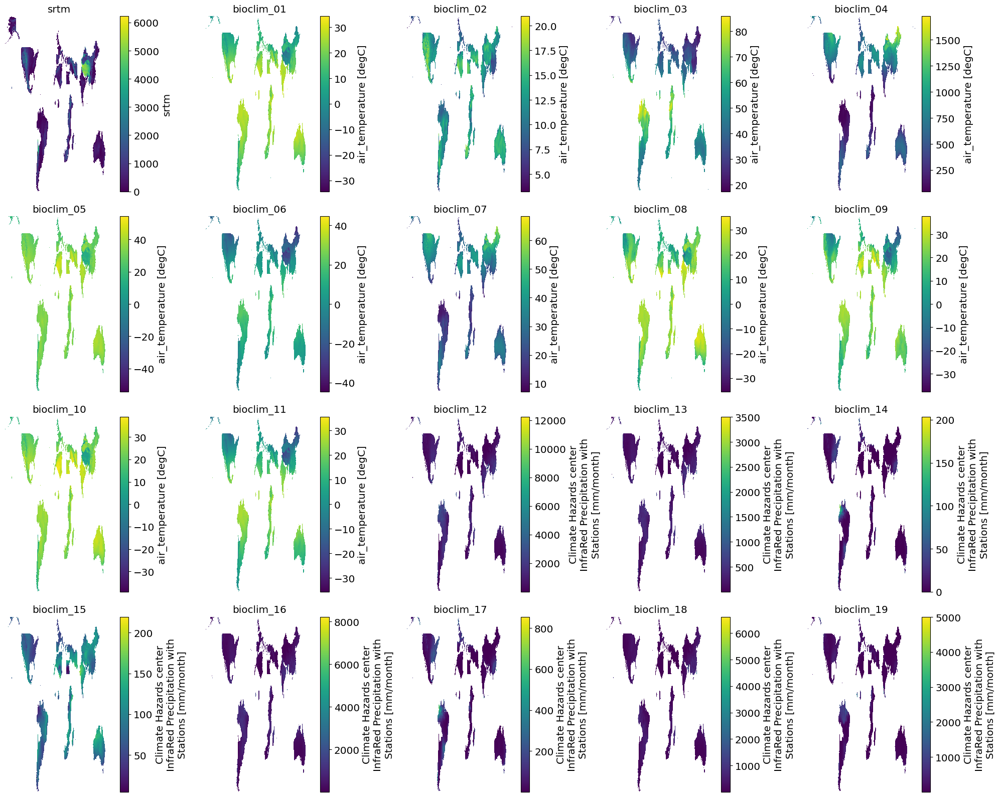

['bioclim_01', 'bioclim_02', 'bioclim_03', 'bioclim_04', 'bioclim_05', 'bioclim_06', 'bioclim_07', 'bioclim_08', 'bioclim_09', 'bioclim_10', 'bioclim_11', 'bioclim_12', 'bioclim_13', 'bioclim_14', 'bioclim_15', 'bioclim_16', 'bioclim_17', 'bioclim_18', 'bioclim_19']


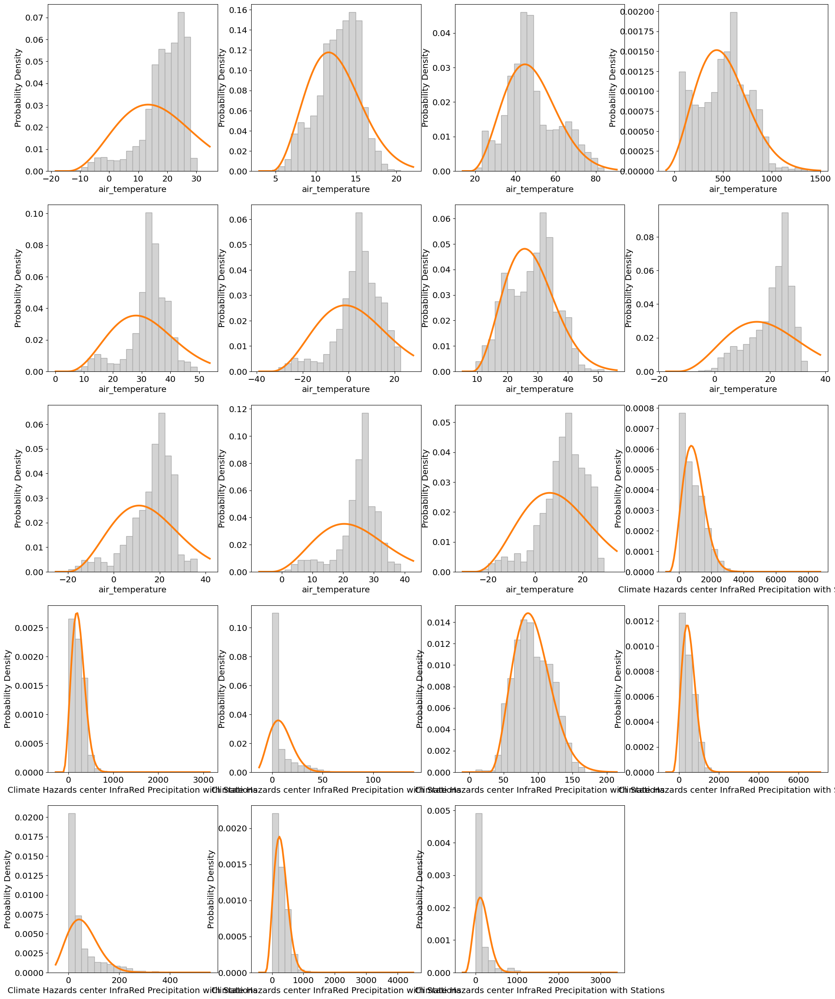

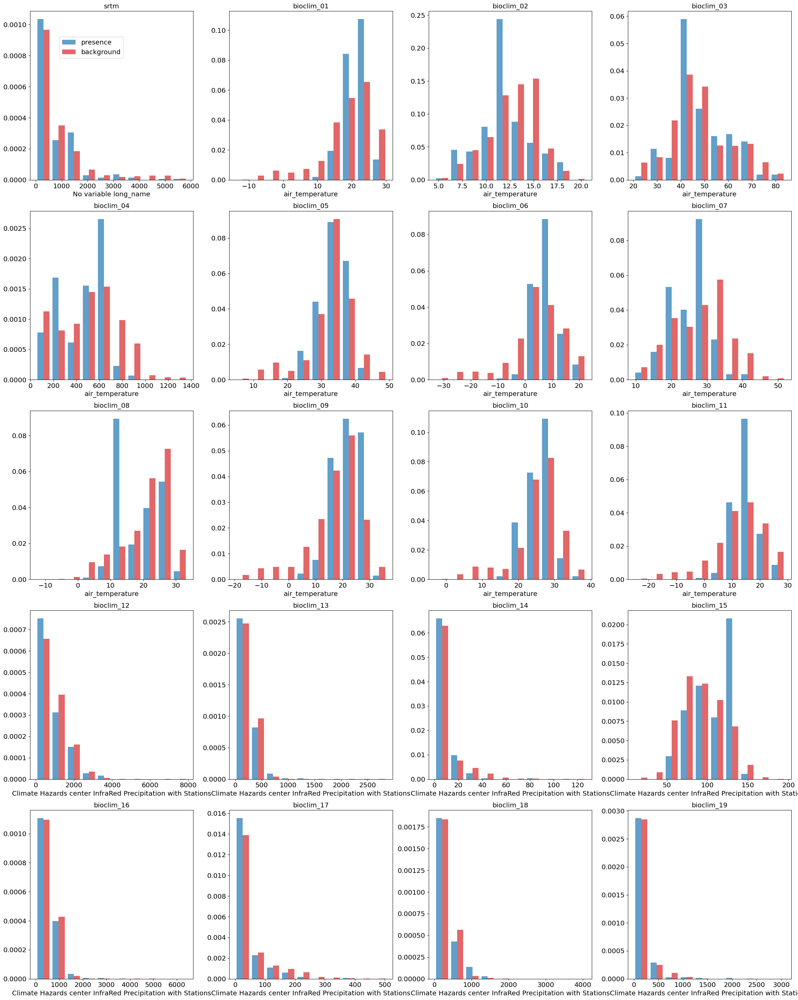

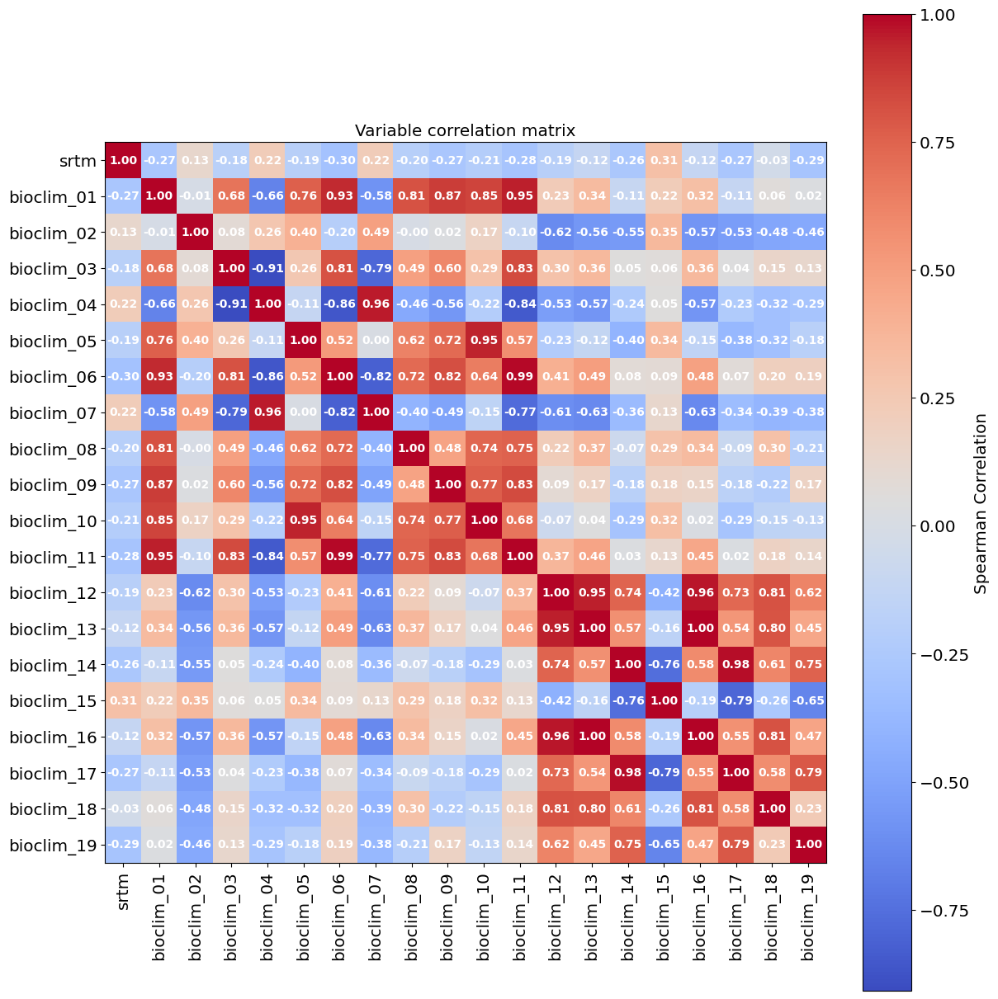

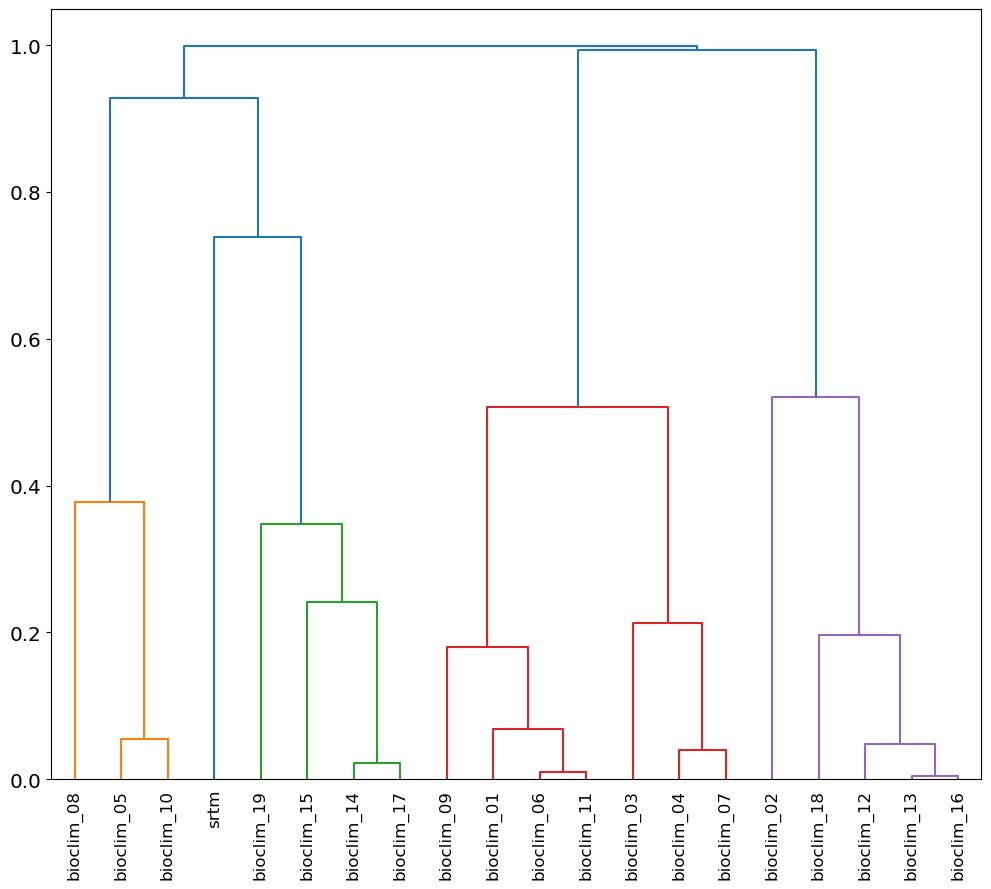

Raster:   0%|                              | 0/20 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/20 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.890
PR-AUC Score: 0.566
2.1 load test data


Raster:   0%|                              | 0/20 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/20 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.12437353 0.00380322 0.17708598 ... 0.04312843 0.10569985 0.06157304]
2.3 test data performance
Training ROC-AUC score: 0.890
Training PR-AUC Score: 0.566
Test ROC-AUC score: 0.719
Test PR-AUC Score: 0.103


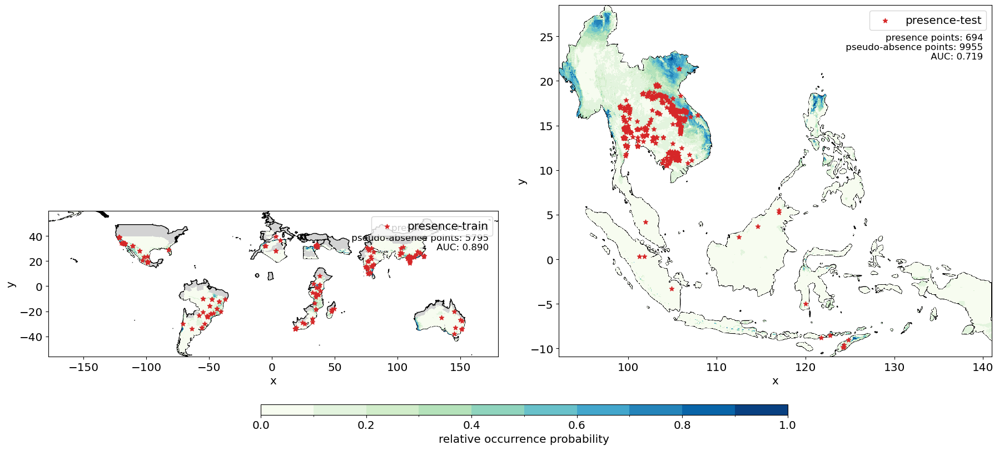

Training ROC-AUC score: 0.890
PR-AUC Score: 0.566


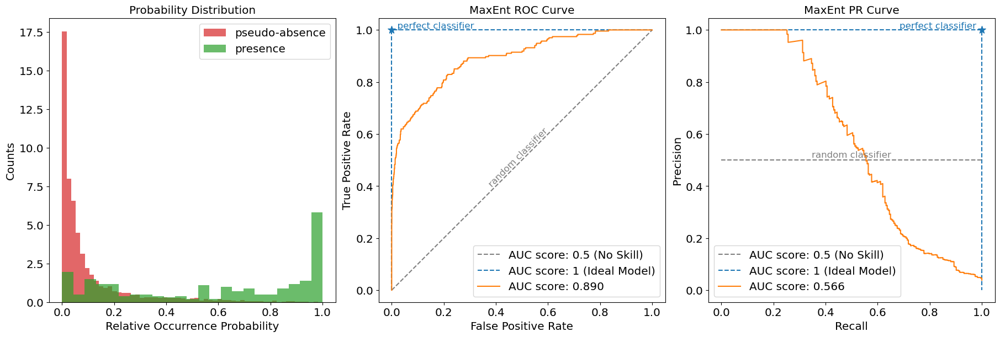

Training ROC-AUC score: 0.890
Test ROC-AUC score: 0.709
Training PR-AUC Score: 0.566
Test PR-AUC Score: 0.097


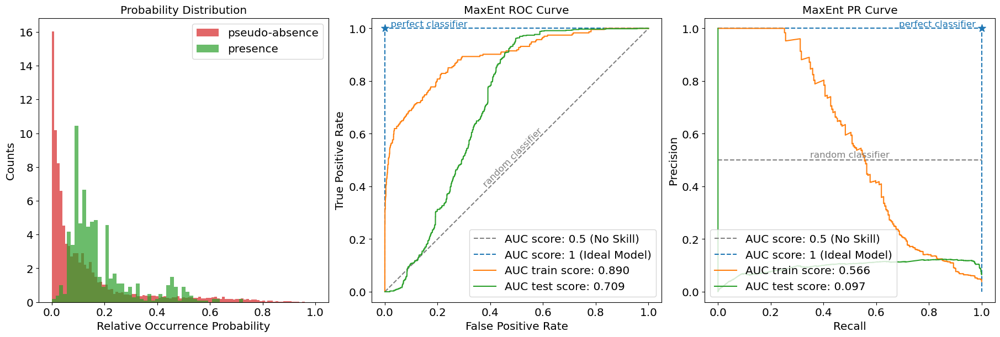

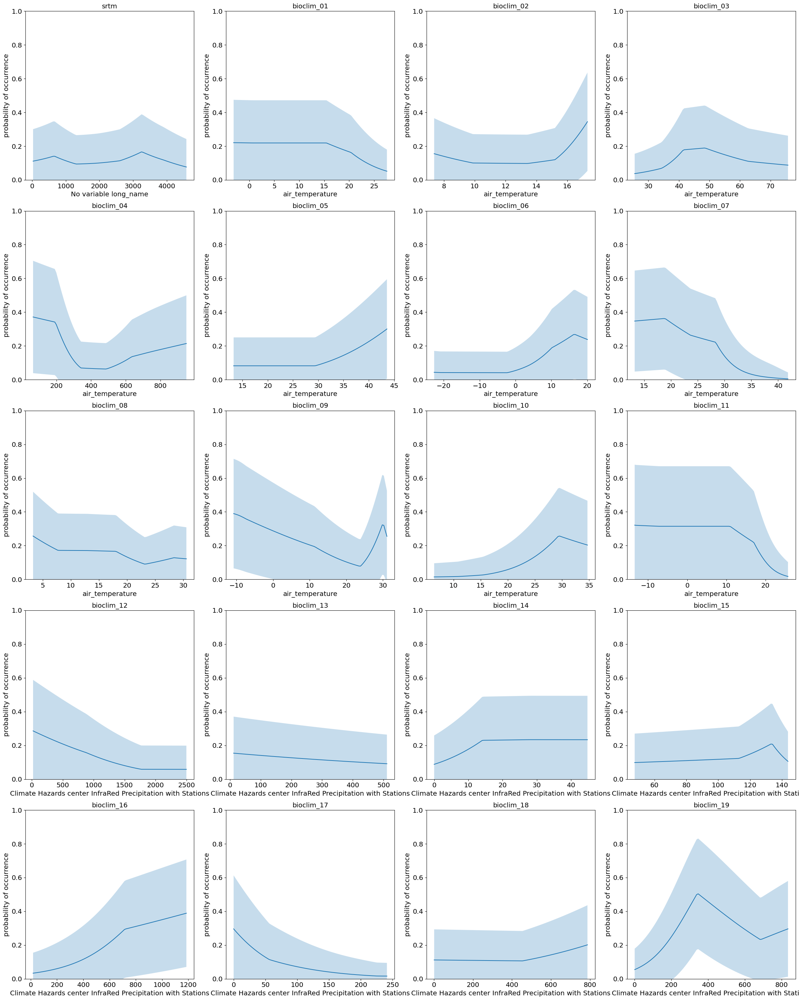

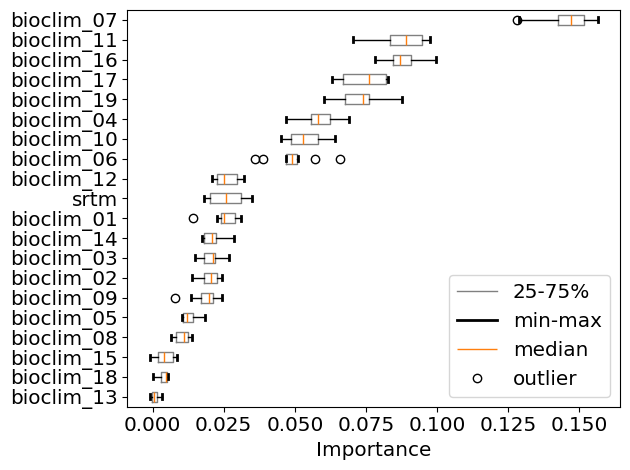

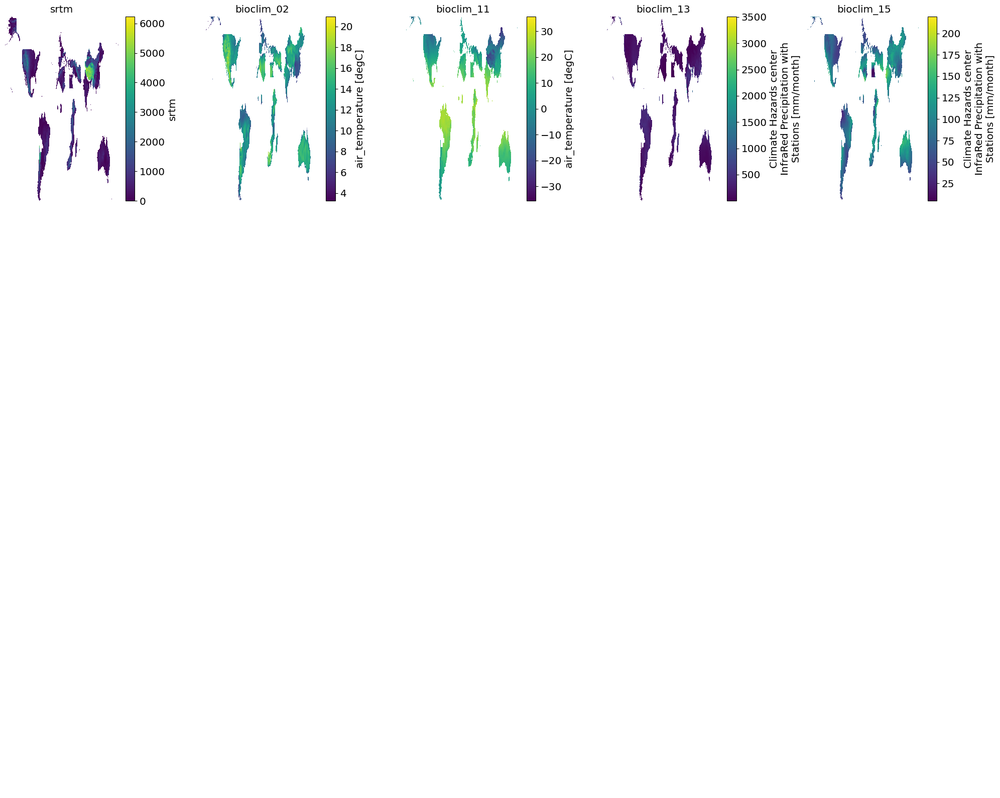

['bioclim_02', 'bioclim_11', 'bioclim_13', 'bioclim_15']


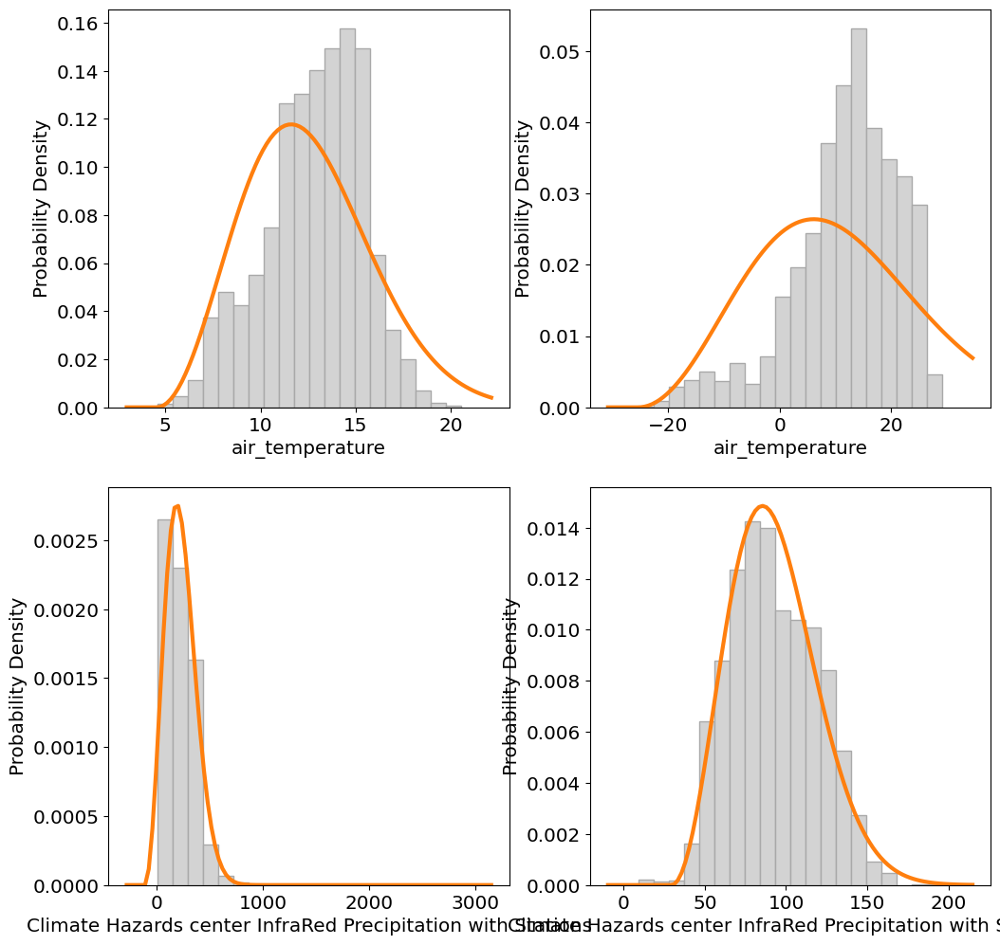

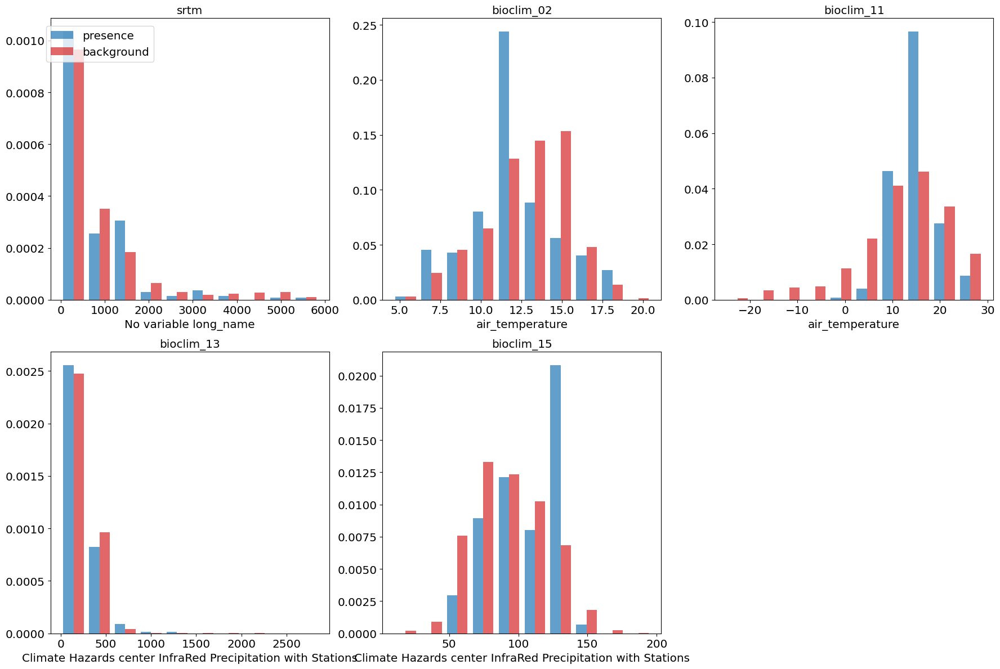

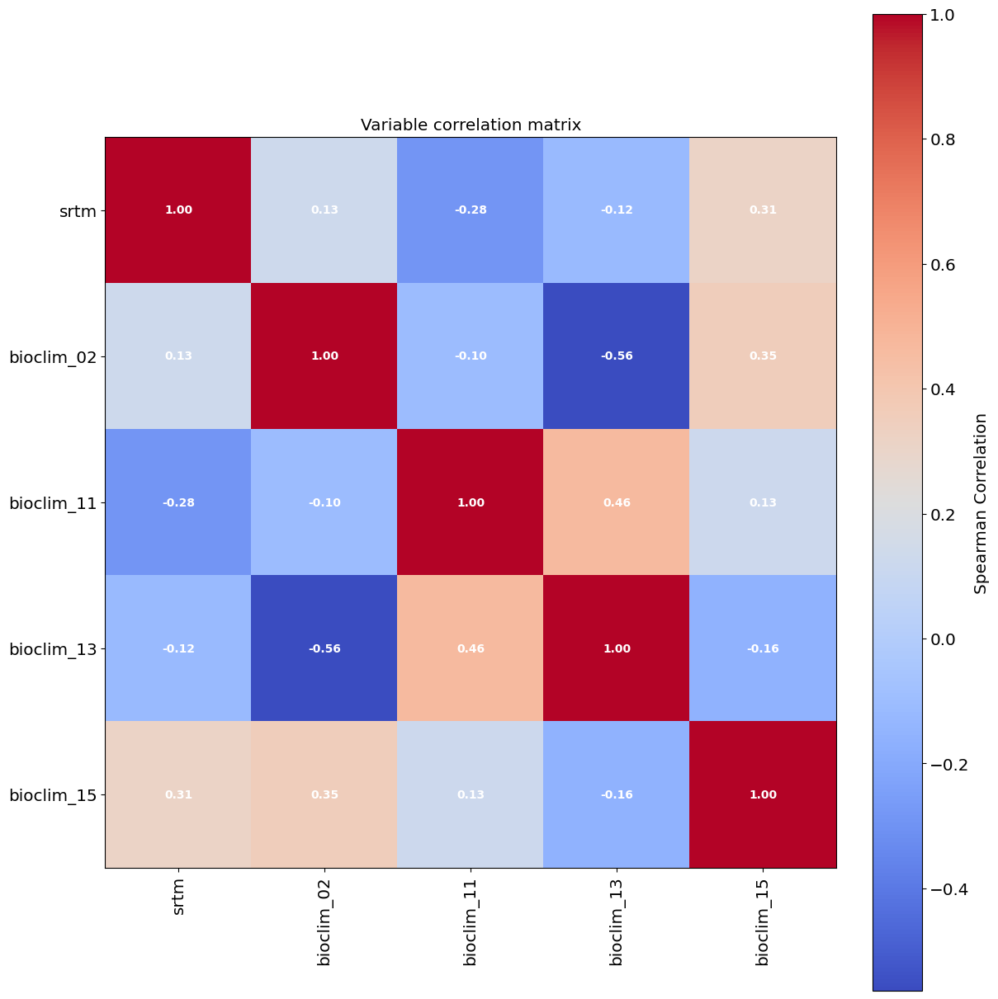

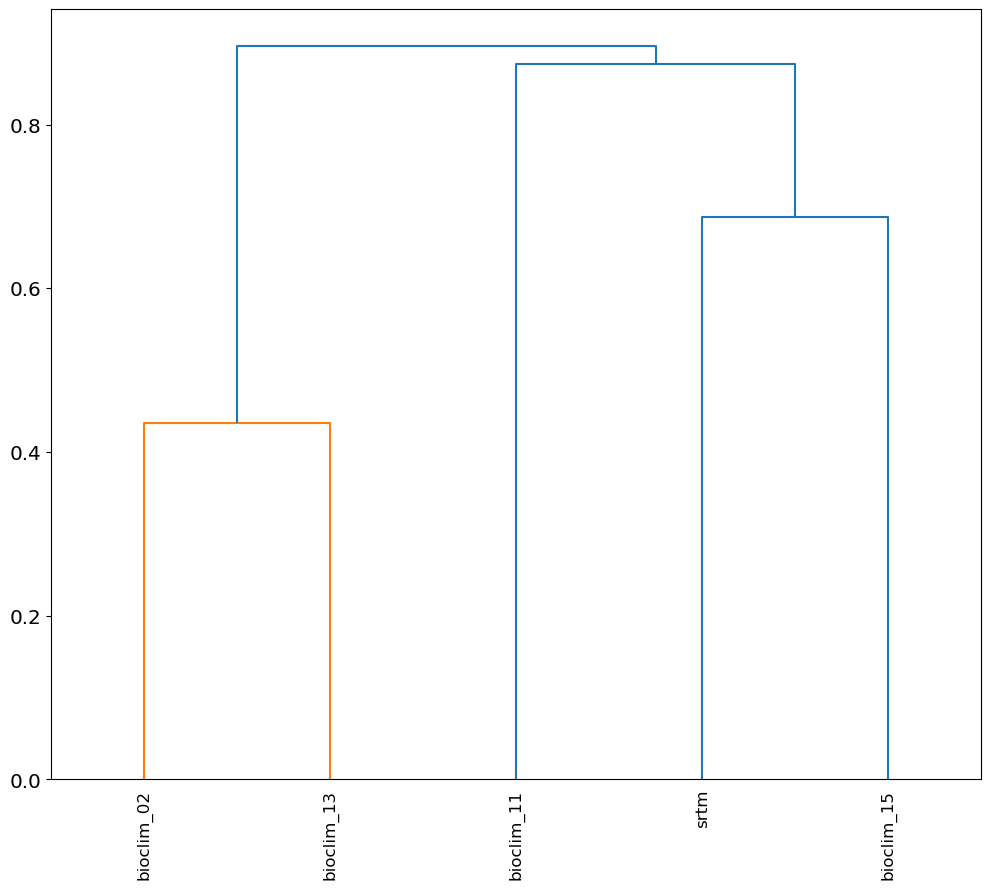

Raster:   0%|                              | 0/5 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/5 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.836
PR-AUC Score: 0.289
2.1 load test data


Raster:   0%|                              | 0/5 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/5 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.2052742  0.11155479 0.71339359 ... 0.12487949 0.15951983 0.14122527]
2.3 test data performance
Training ROC-AUC score: 0.836
Training PR-AUC Score: 0.289
Test ROC-AUC score: 0.644
Test PR-AUC Score: 0.080


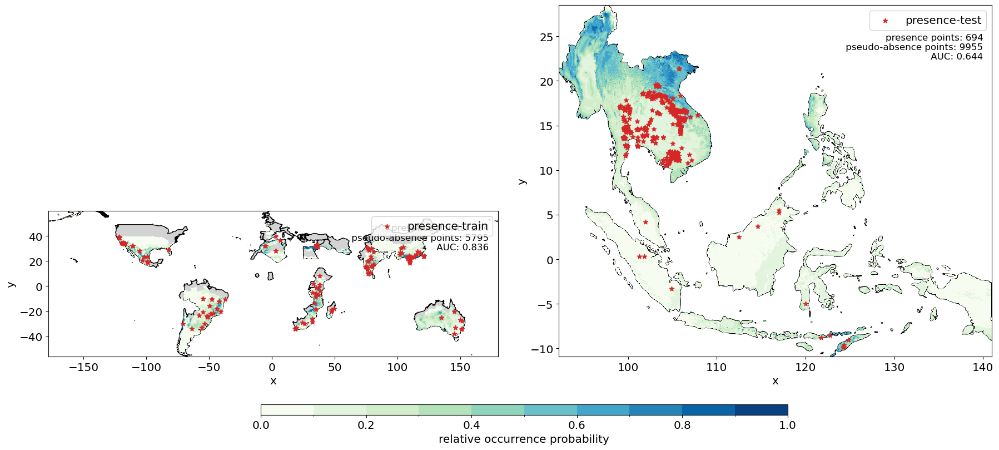

Training ROC-AUC score: 0.836
PR-AUC Score: 0.289


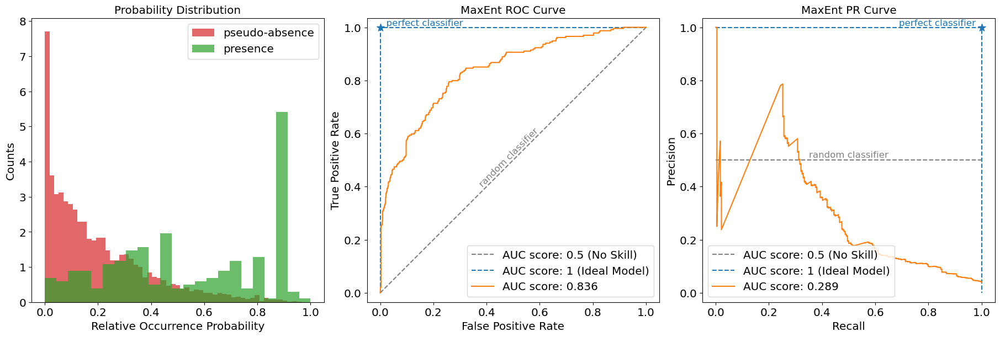

Training ROC-AUC score: 0.836
Test ROC-AUC score: 0.654
Training PR-AUC Score: 0.289
Test PR-AUC Score: 0.082


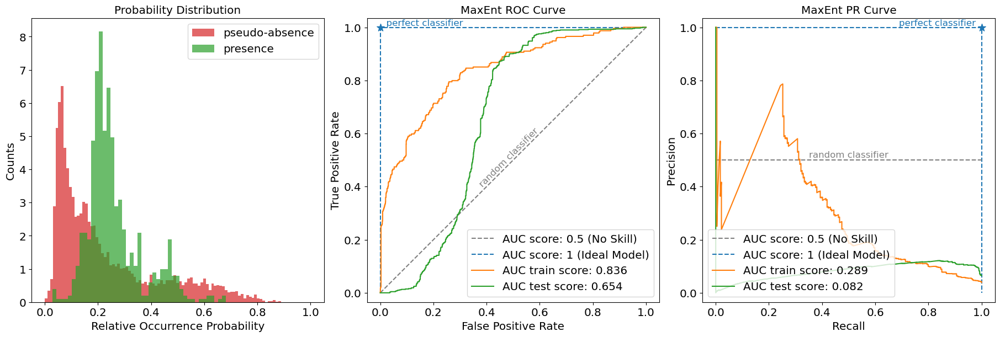

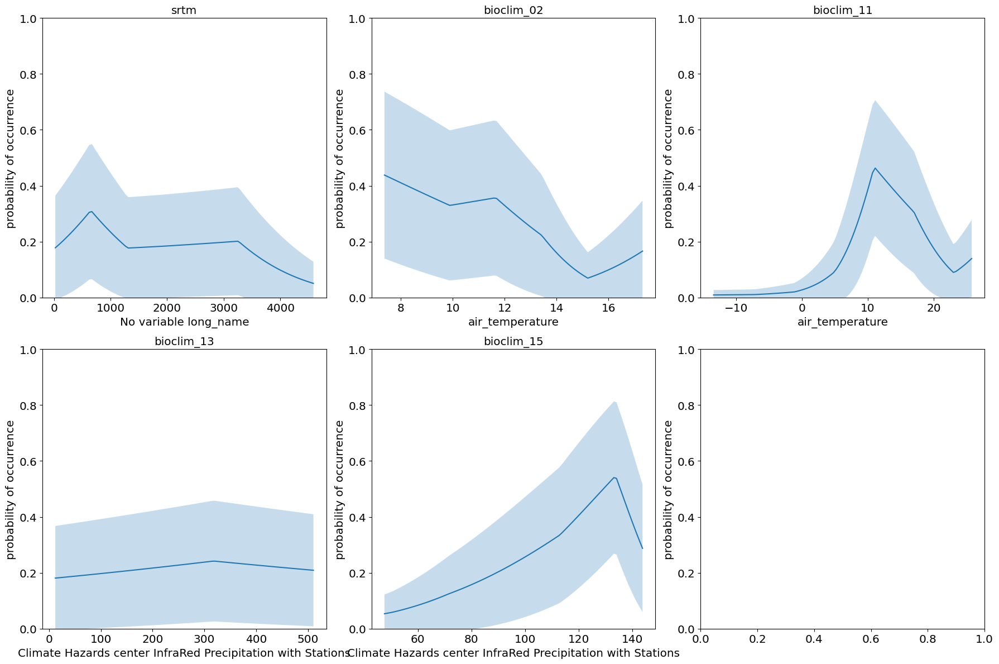

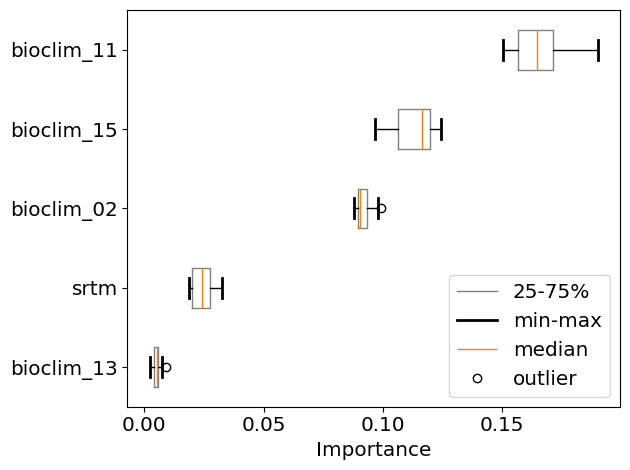

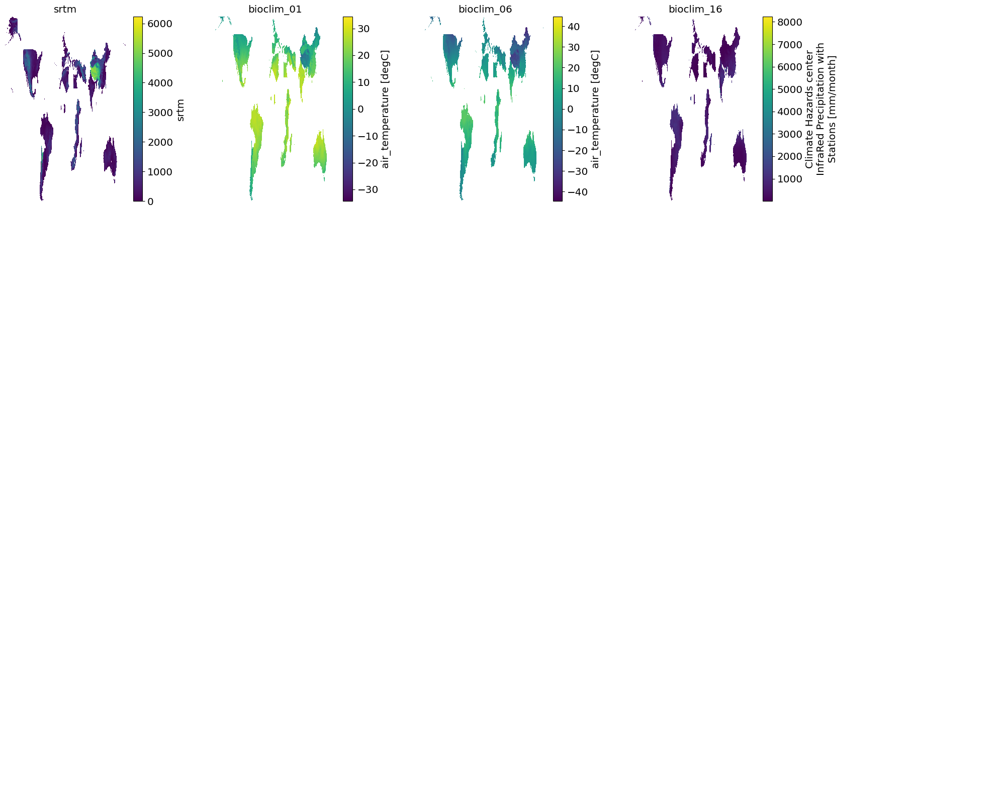

['bioclim_01', 'bioclim_06', 'bioclim_16']


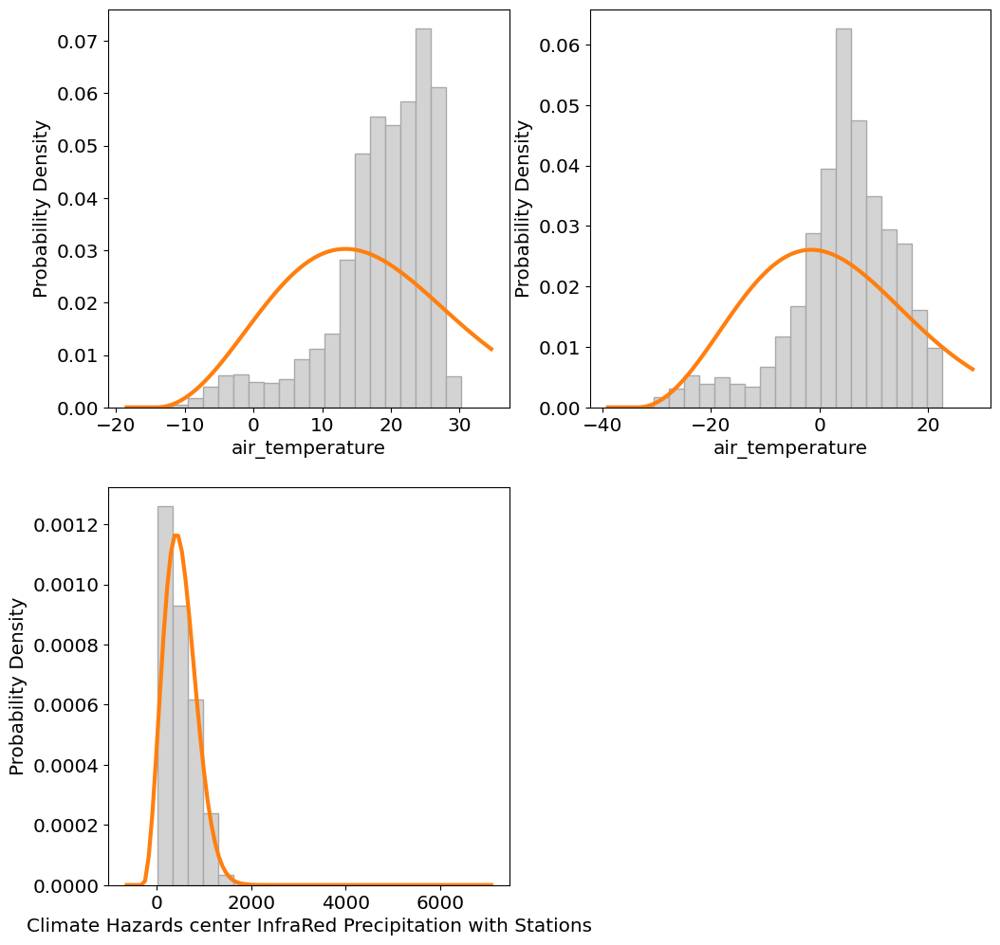

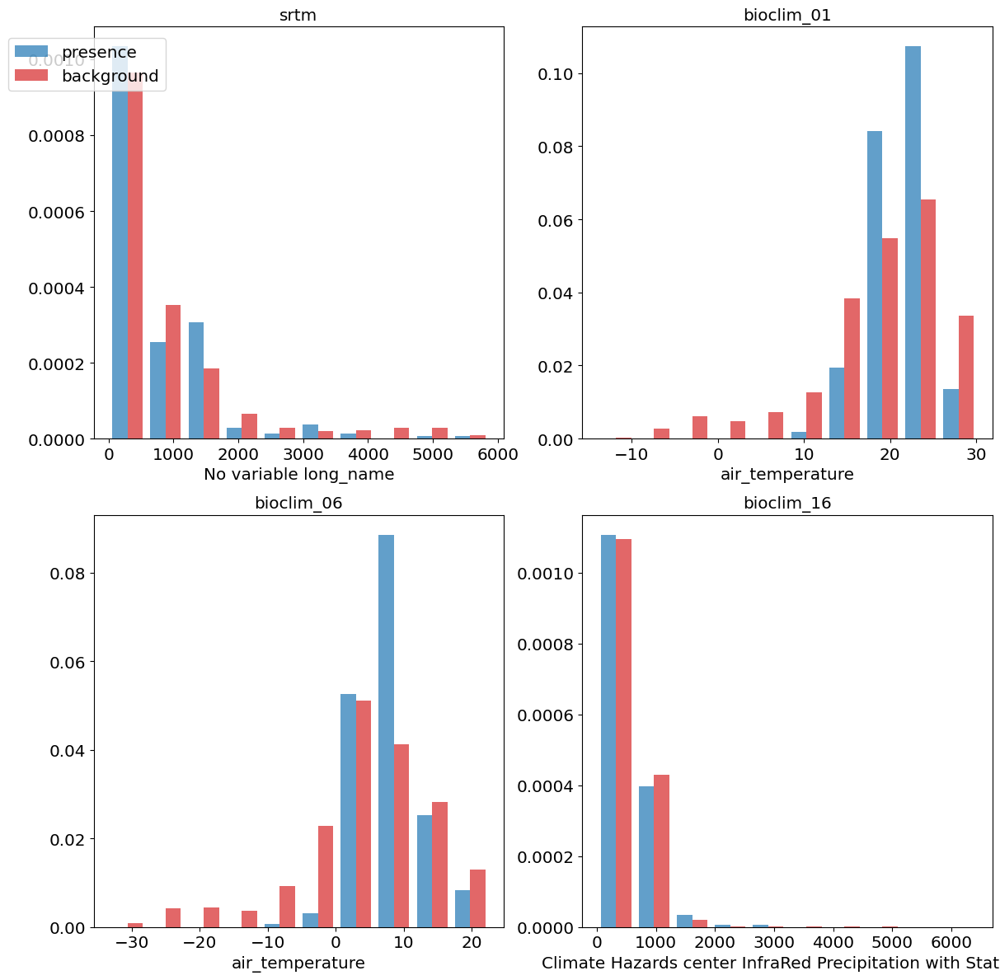

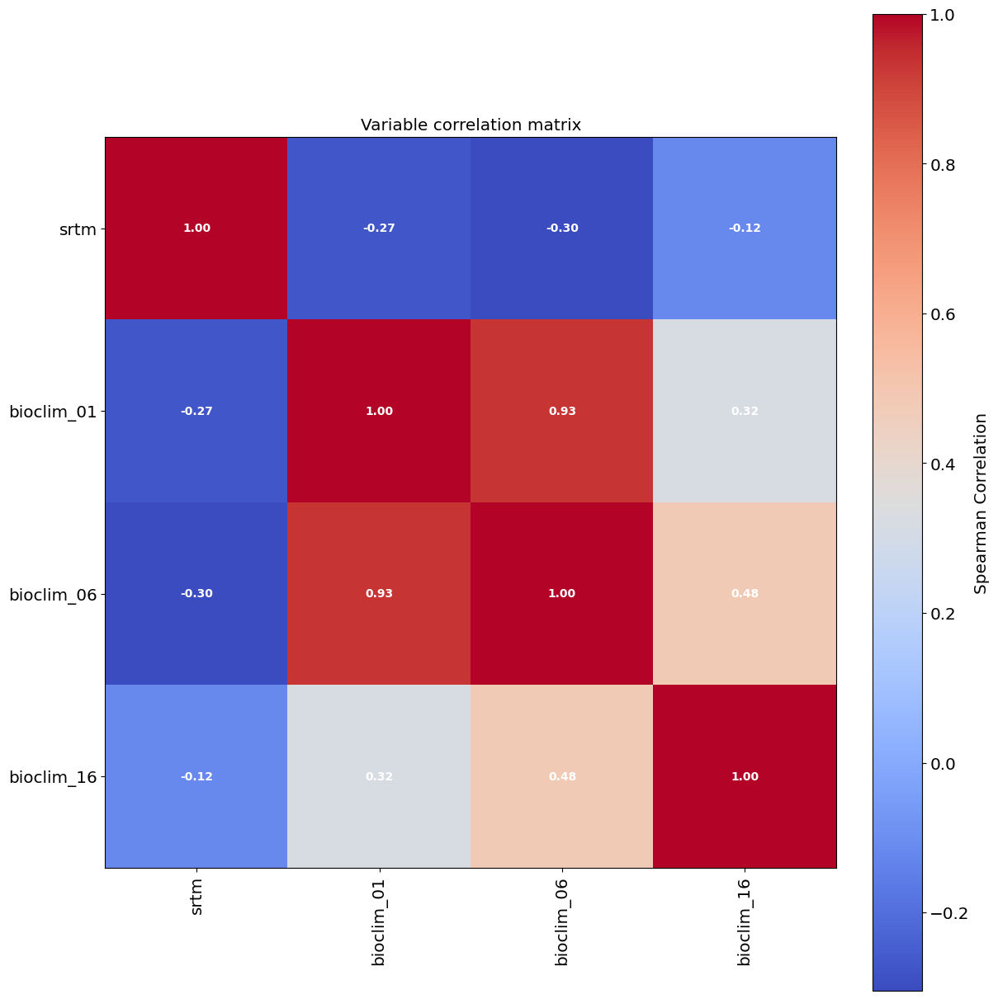

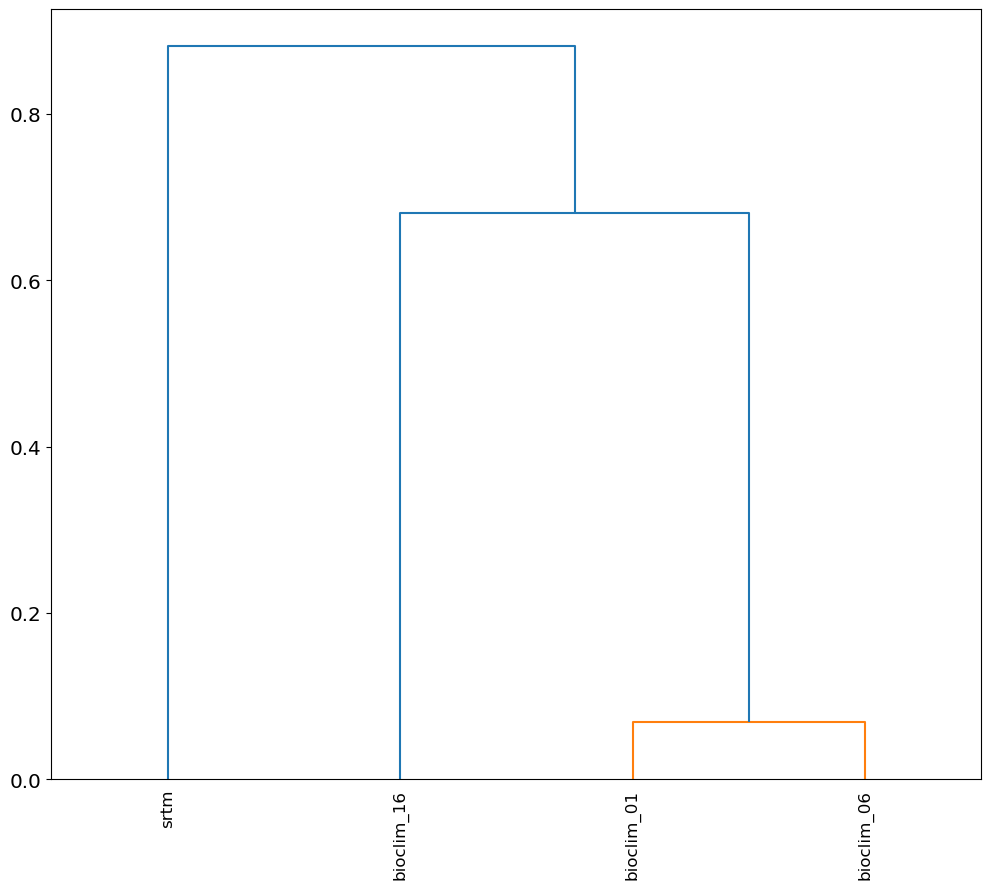

Raster:   0%|                              | 0/4 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/4 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.806
PR-AUC Score: 0.128
2.1 load test data


Raster:   0%|                              | 0/4 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/4 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.15586253 0.48601337 0.80667048 ... 0.0236629  0.53806876 0.29018689]
2.3 test data performance
Training ROC-AUC score: 0.806
Training PR-AUC Score: 0.128
Test ROC-AUC score: 0.226
Test PR-AUC Score: 0.039


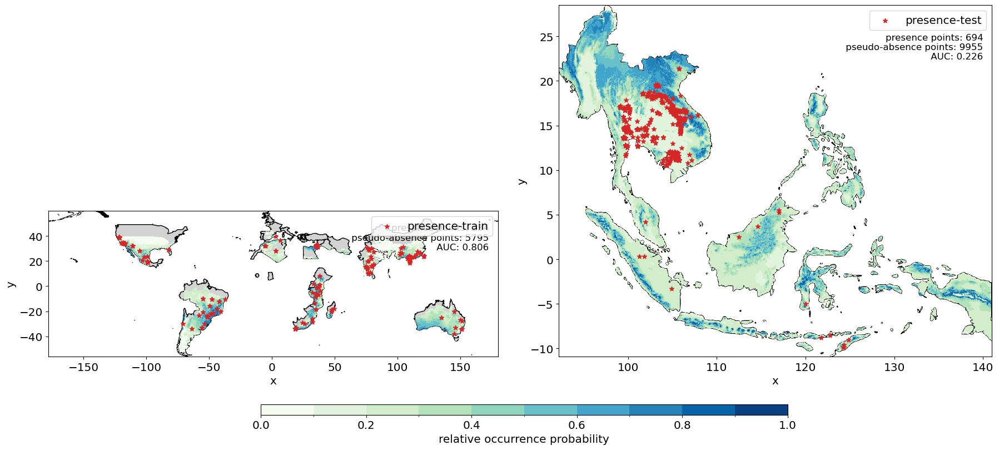

Training ROC-AUC score: 0.806
PR-AUC Score: 0.128


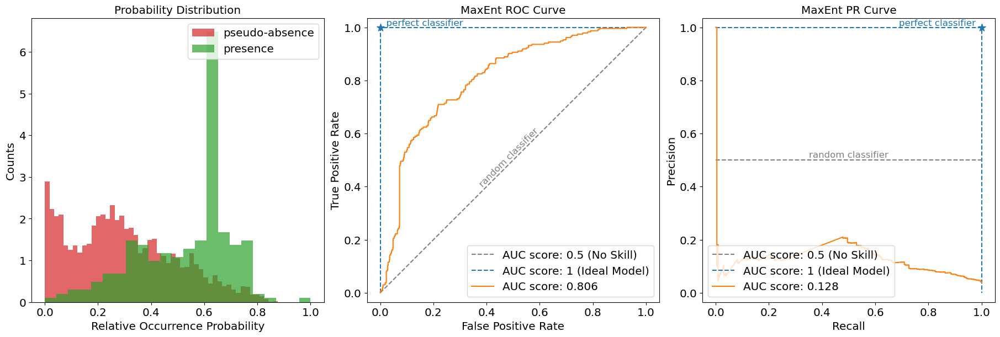

Training ROC-AUC score: 0.806
Test ROC-AUC score: 0.225
Training PR-AUC Score: 0.128
Test PR-AUC Score: 0.039


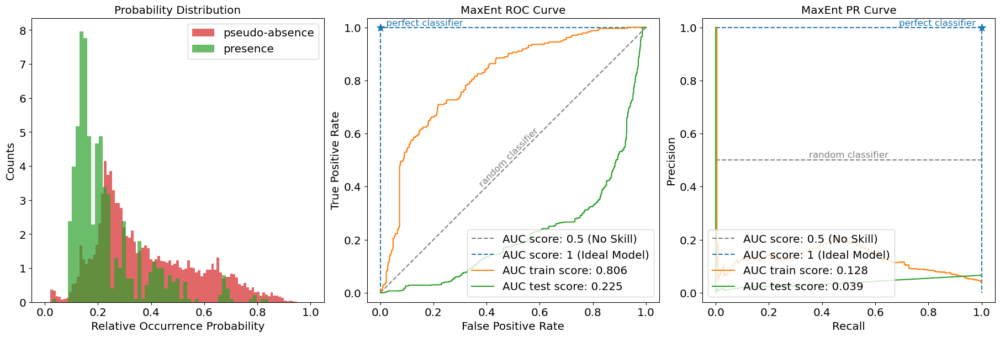

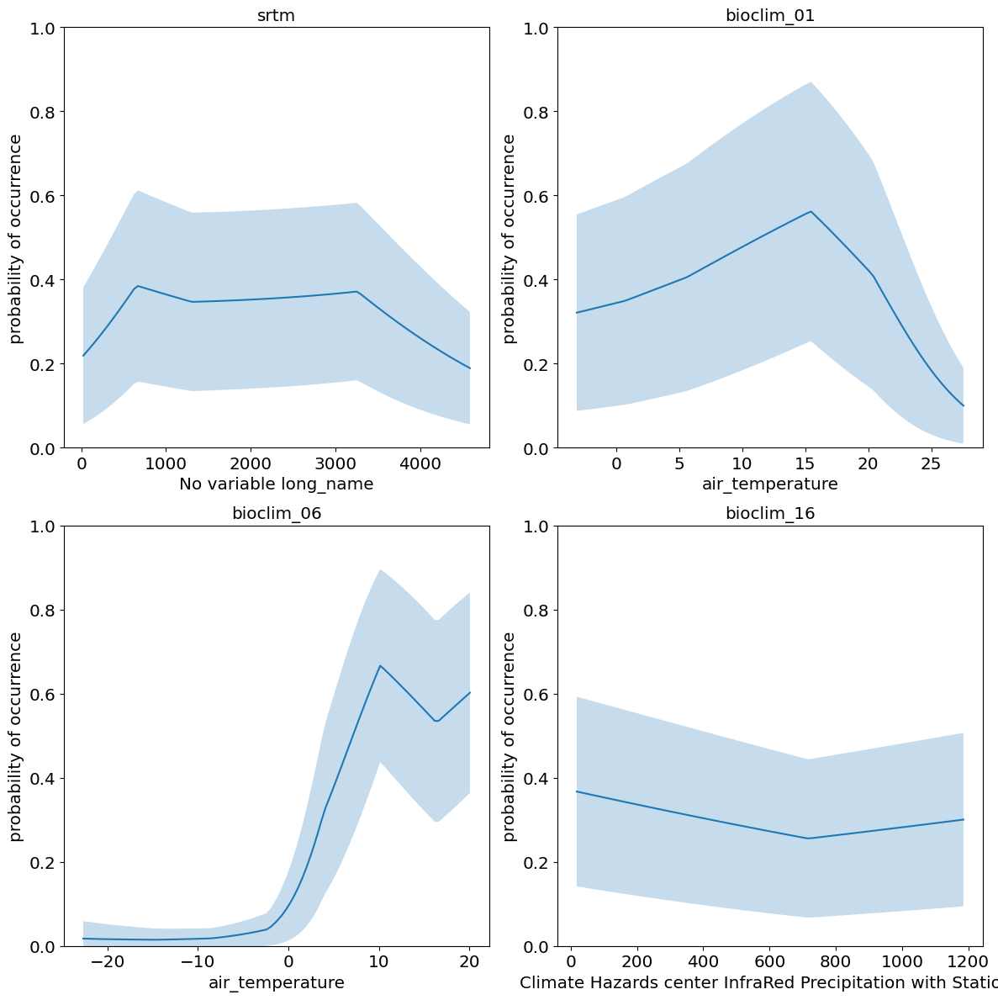

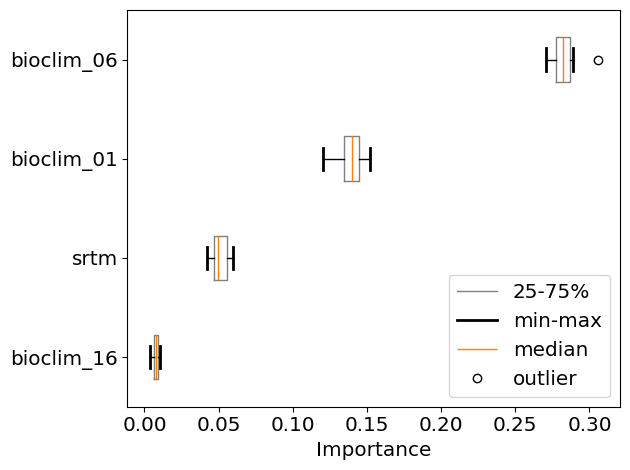

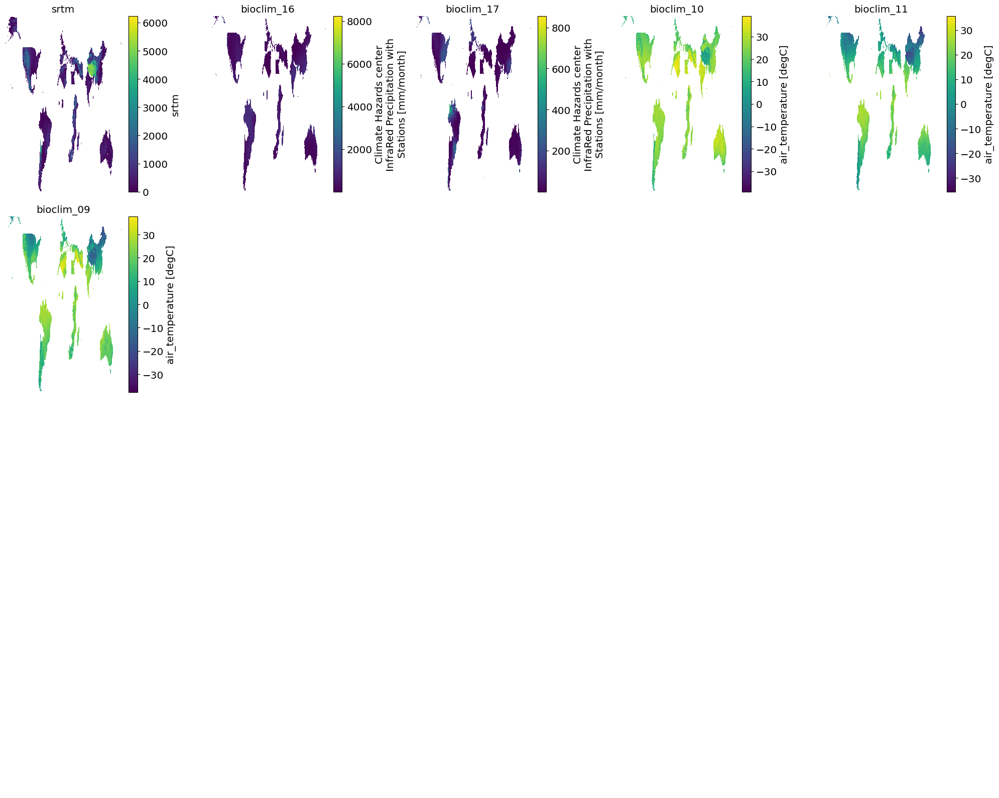

['bioclim_16', 'bioclim_17', 'bioclim_10', 'bioclim_11', 'bioclim_09']


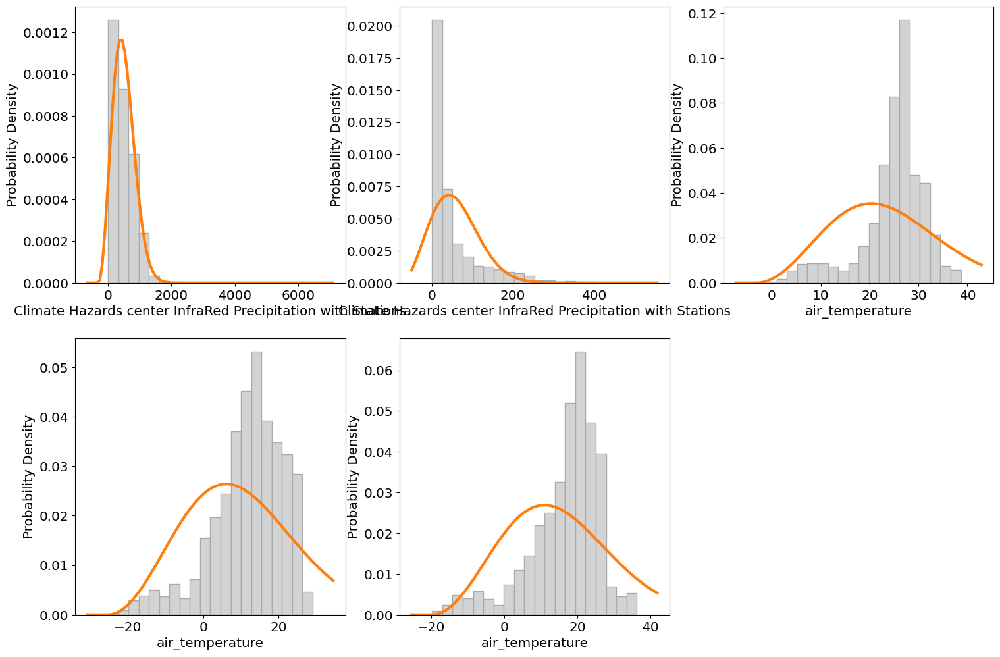

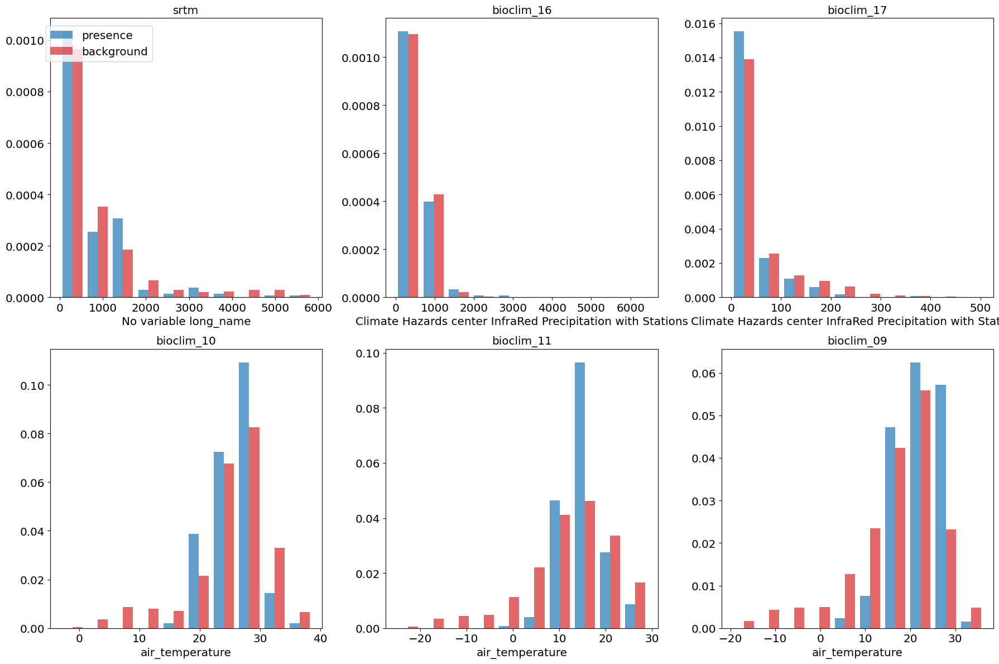

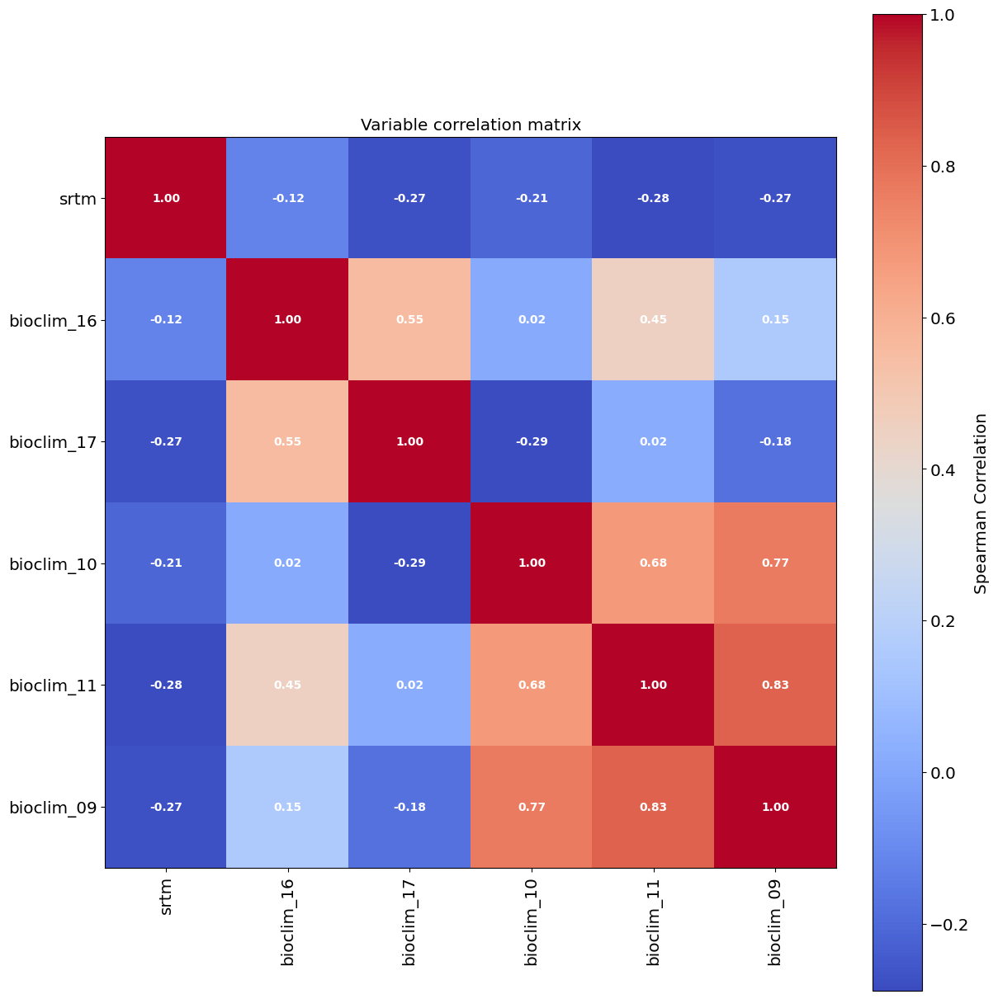

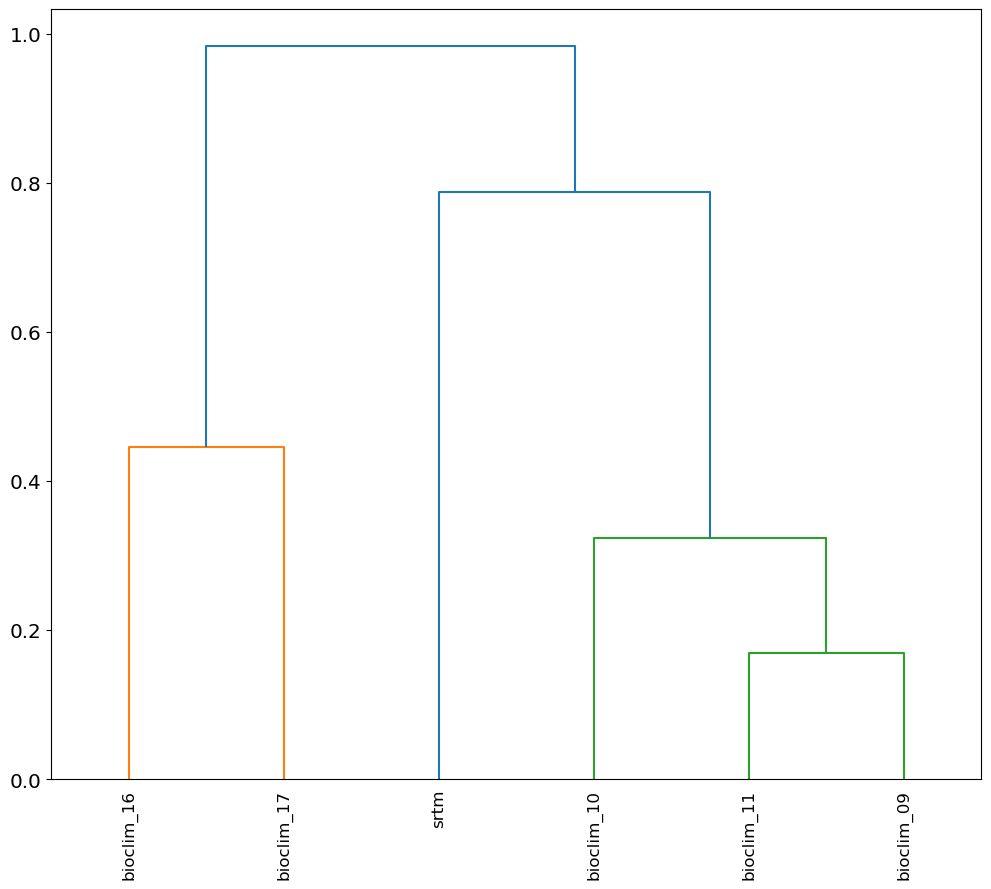

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.846
PR-AUC Score: 0.404
2.1 load test data


Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.26251955 0.01237985 0.20642832 ... 0.14646416 0.02493423 0.05345161]
2.3 test data performance
Training ROC-AUC score: 0.846
Training PR-AUC Score: 0.404
Test ROC-AUC score: 0.666
Test PR-AUC Score: 0.085


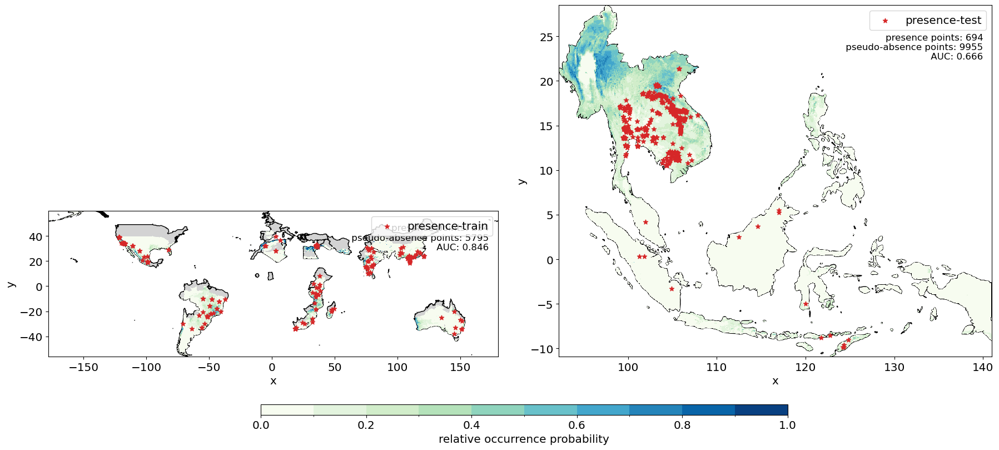

Training ROC-AUC score: 0.846
PR-AUC Score: 0.404


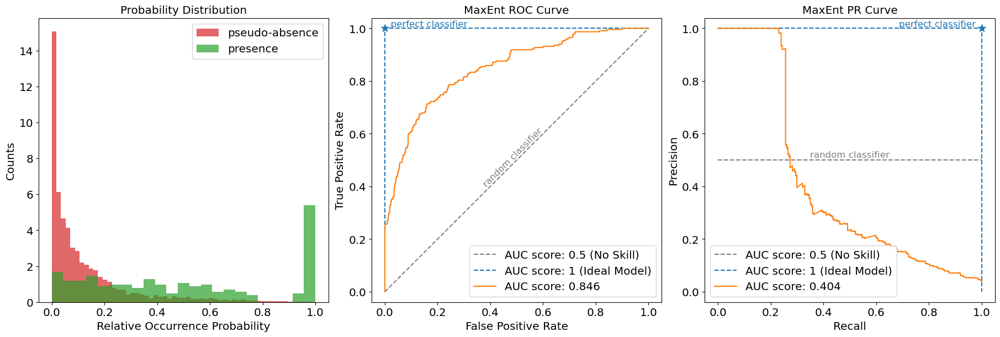

Training ROC-AUC score: 0.846
Test ROC-AUC score: 0.674
Training PR-AUC Score: 0.404
Test PR-AUC Score: 0.087


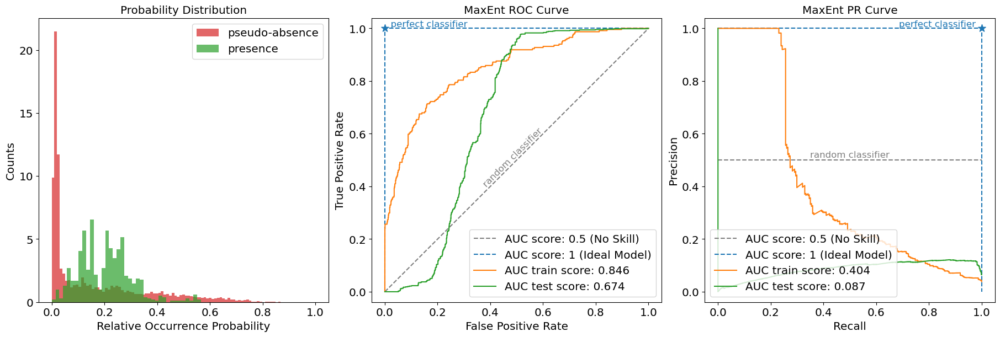

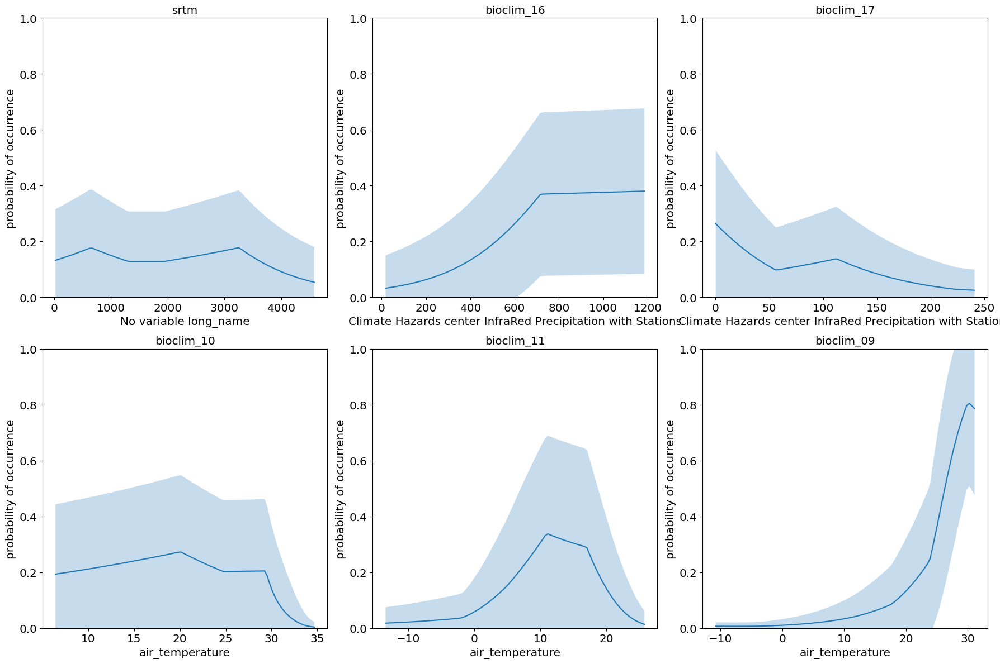

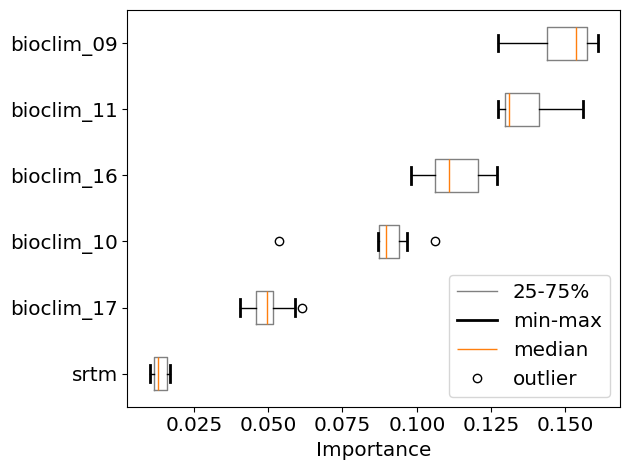

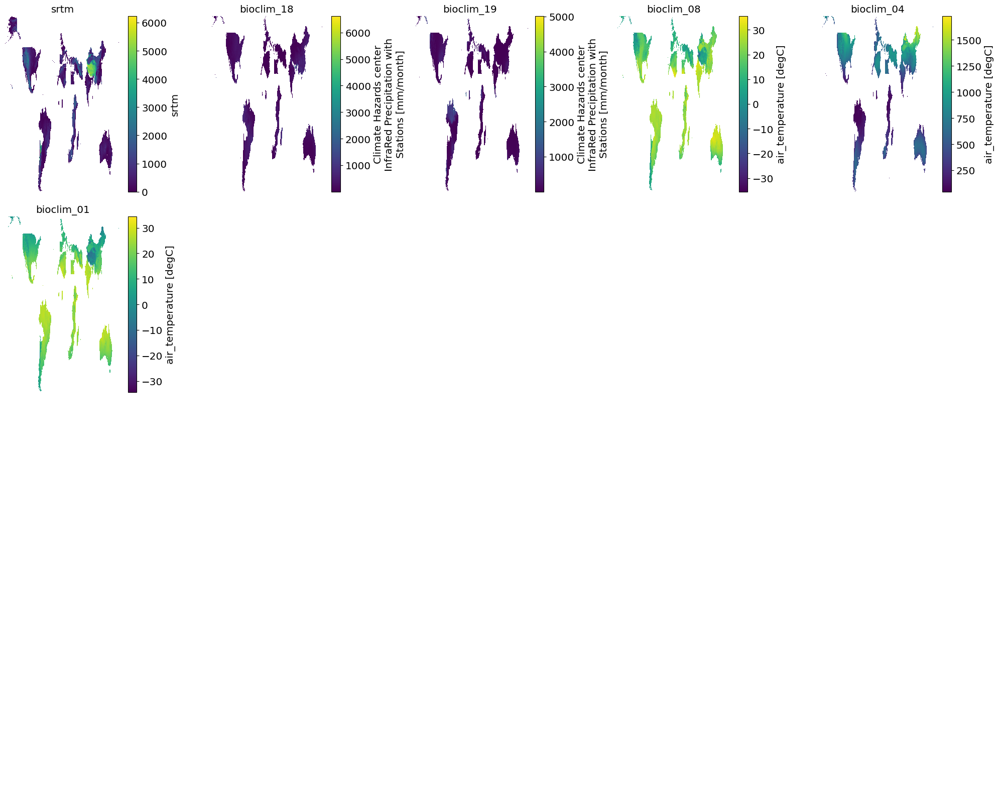

['bioclim_18', 'bioclim_19', 'bioclim_08', 'bioclim_04', 'bioclim_01']


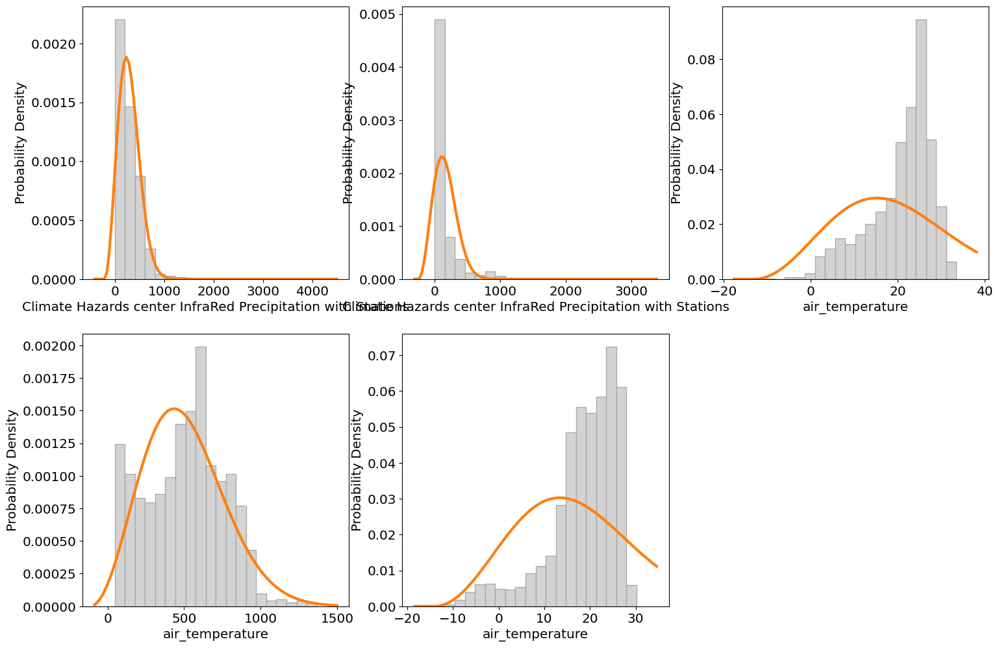

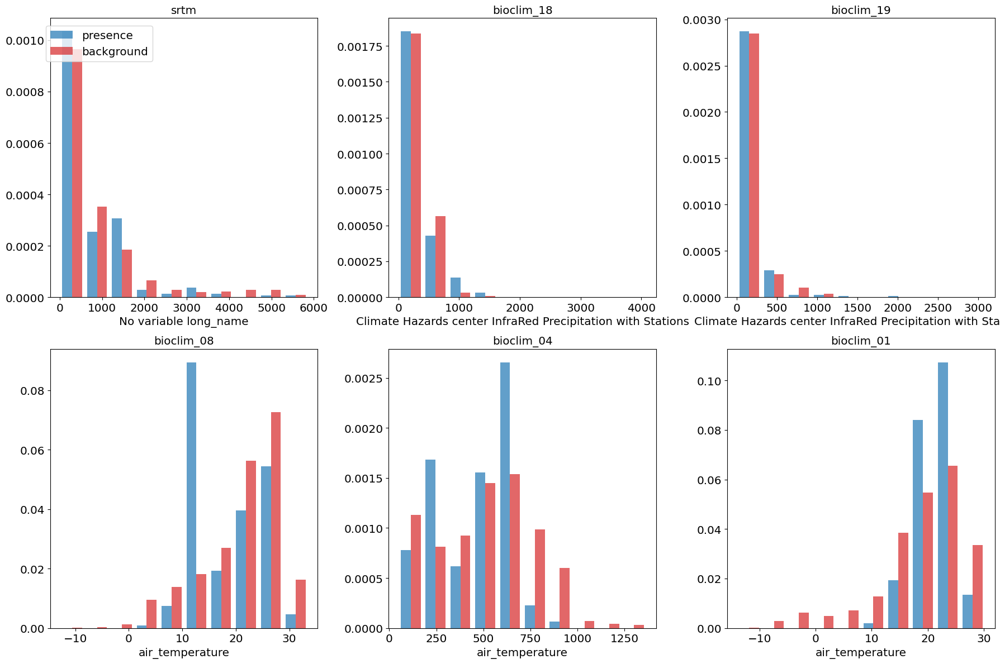

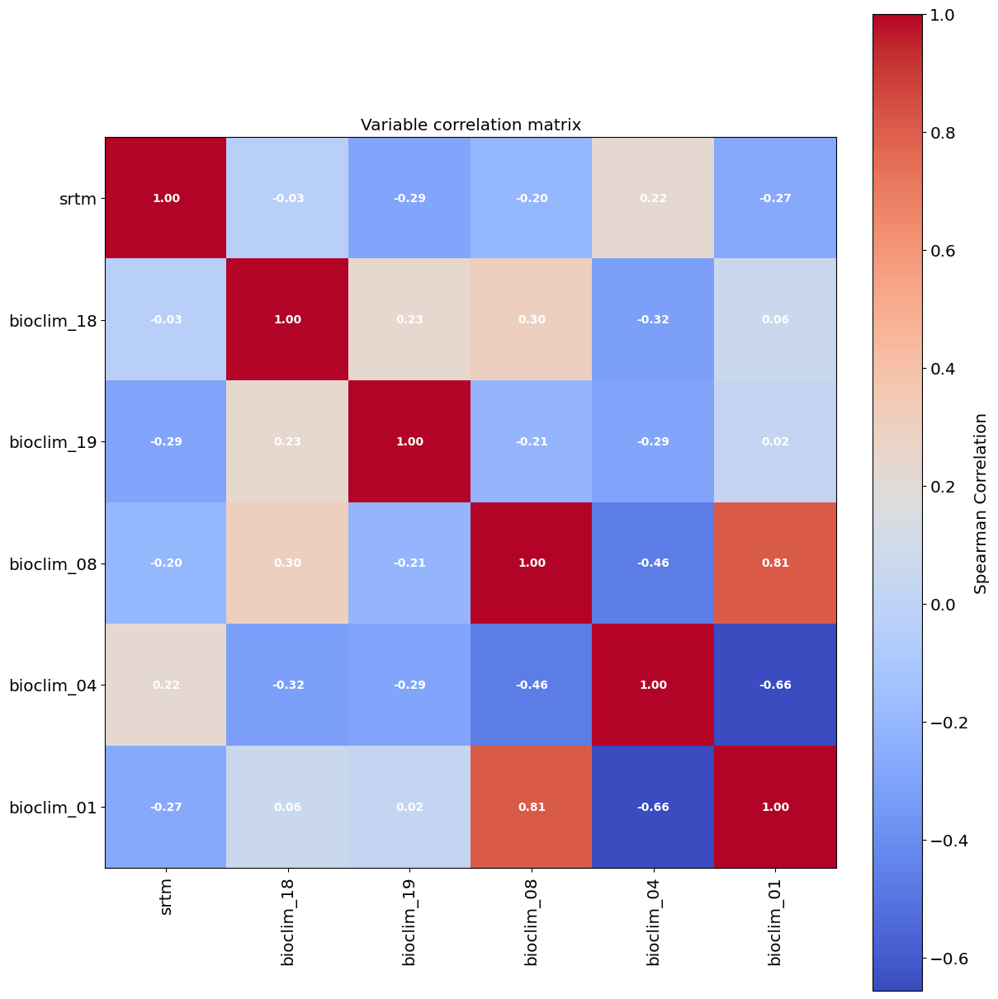

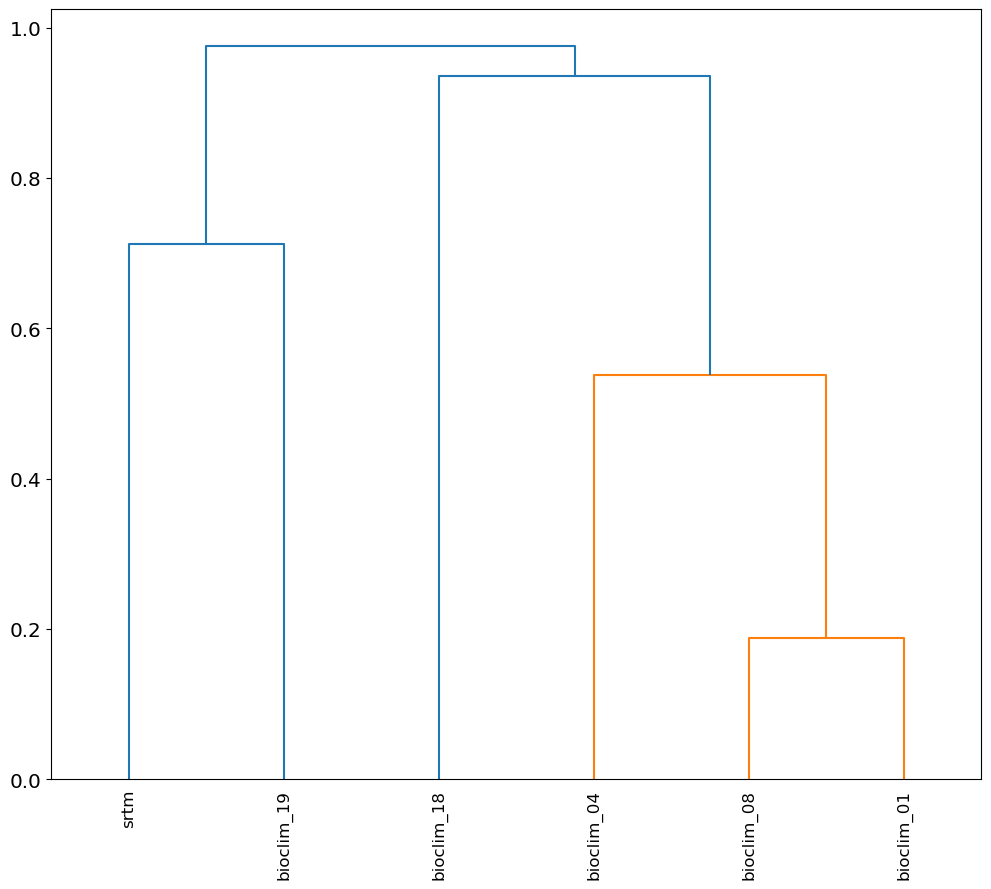

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.850
PR-AUC Score: 0.502
2.1 load test data


Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.05838211 0.10338016 0.39354722 ... 0.20051129 0.86415674 0.3407044 ]
2.3 test data performance
Training ROC-AUC score: 0.850
Training PR-AUC Score: 0.502
Test ROC-AUC score: 0.314
Test PR-AUC Score: 0.043


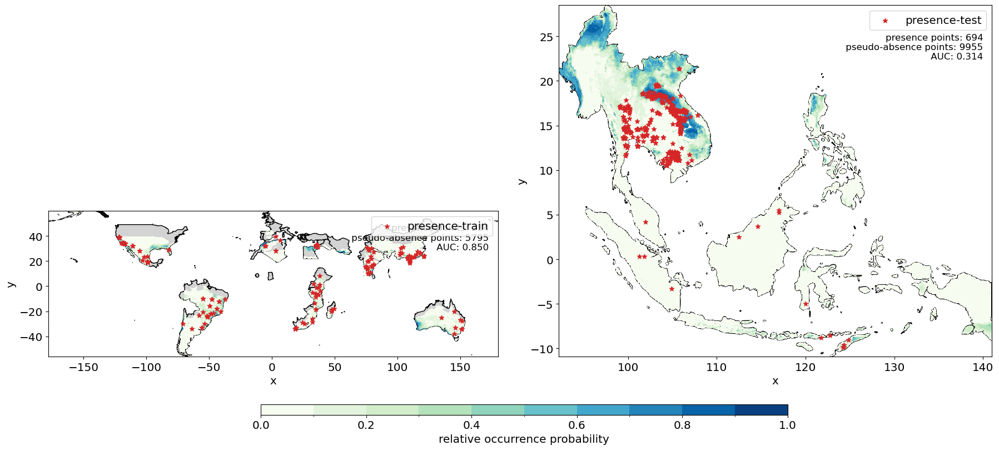

Training ROC-AUC score: 0.850
PR-AUC Score: 0.502


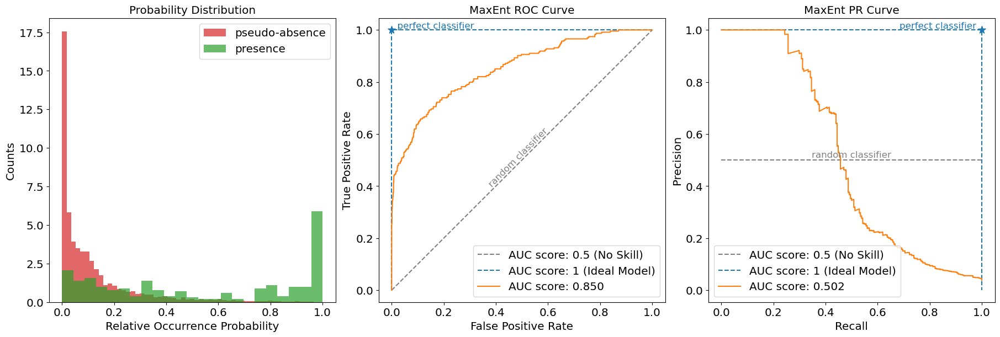

Training ROC-AUC score: 0.850
Test ROC-AUC score: 0.670
Training PR-AUC Score: 0.502
Test PR-AUC Score: 0.096


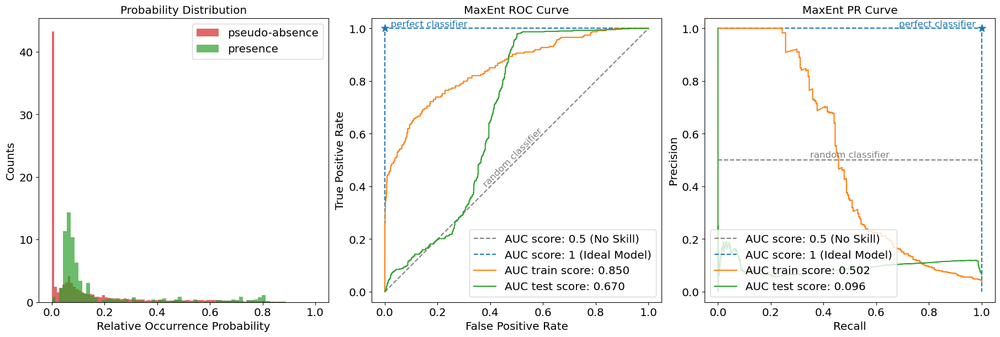

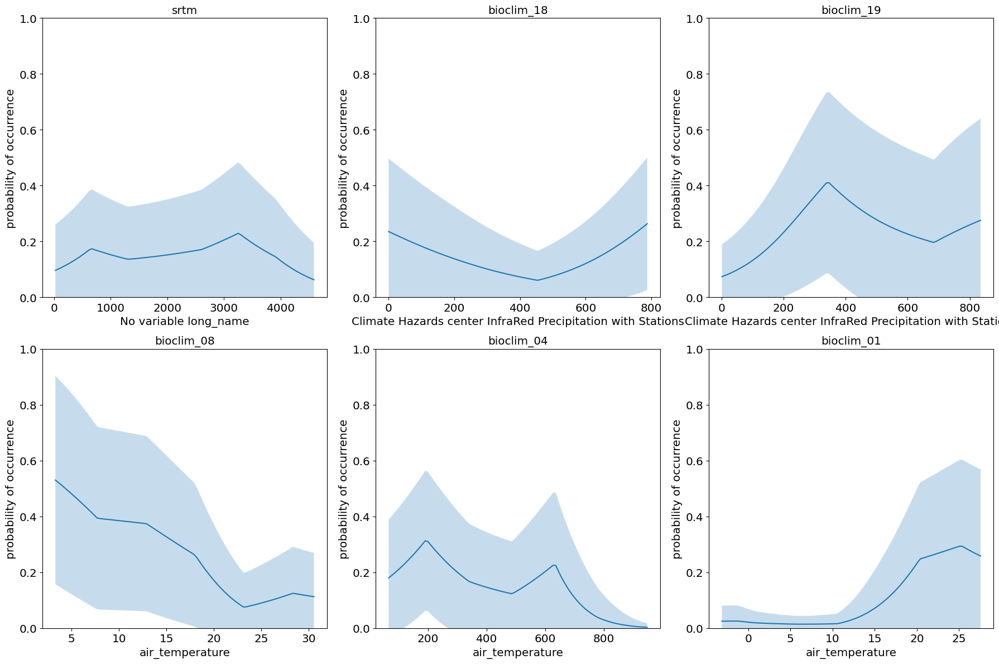

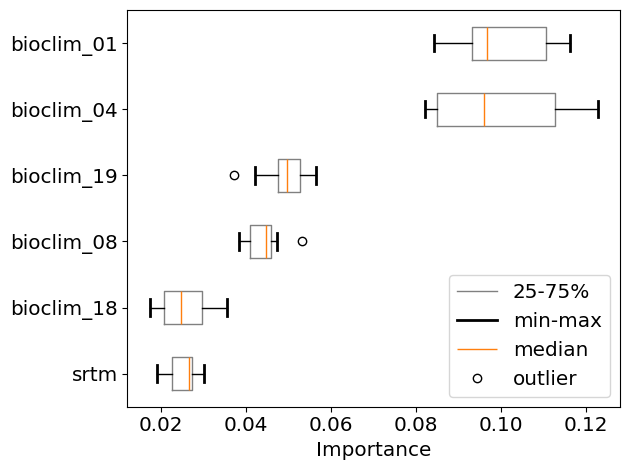

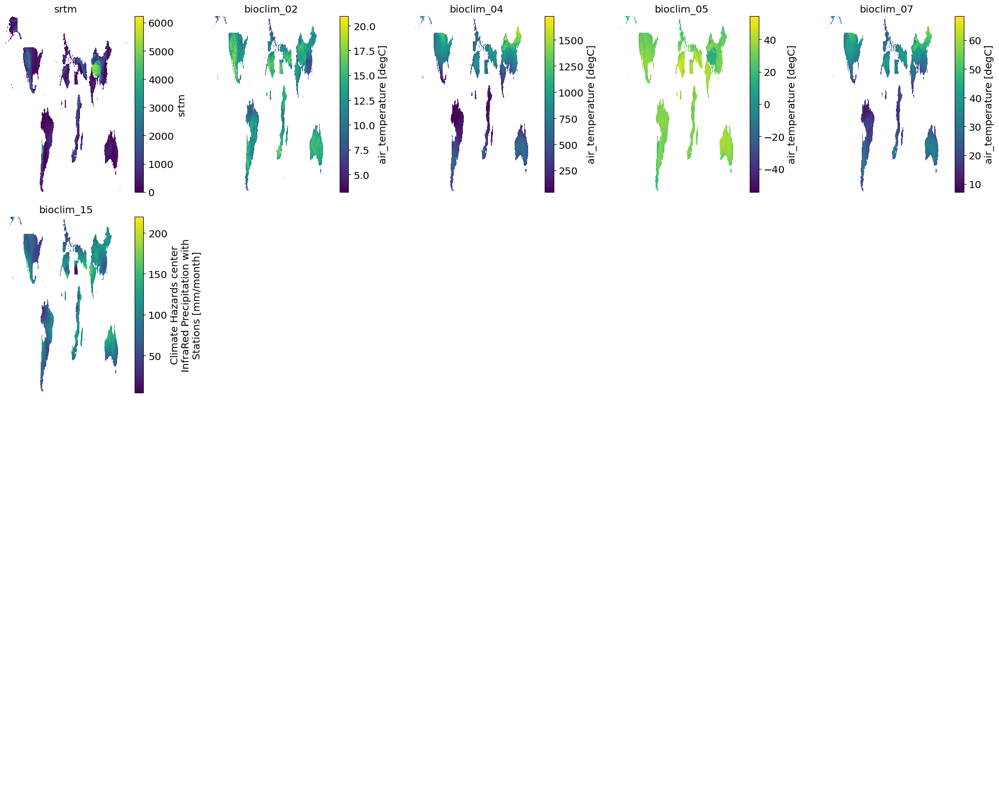

['bioclim_02', 'bioclim_04', 'bioclim_05', 'bioclim_07', 'bioclim_15']


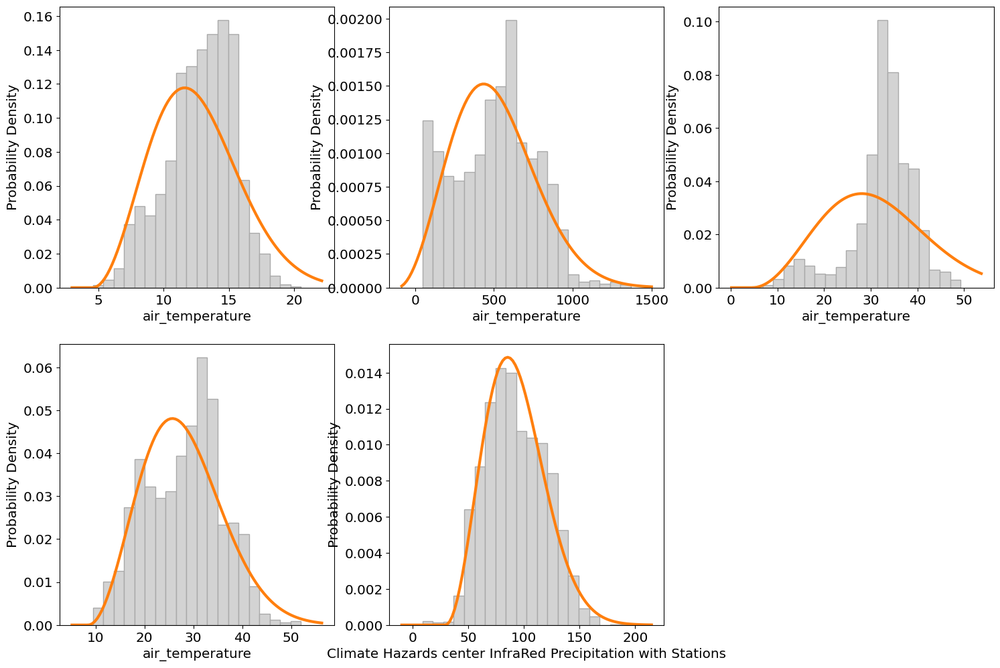

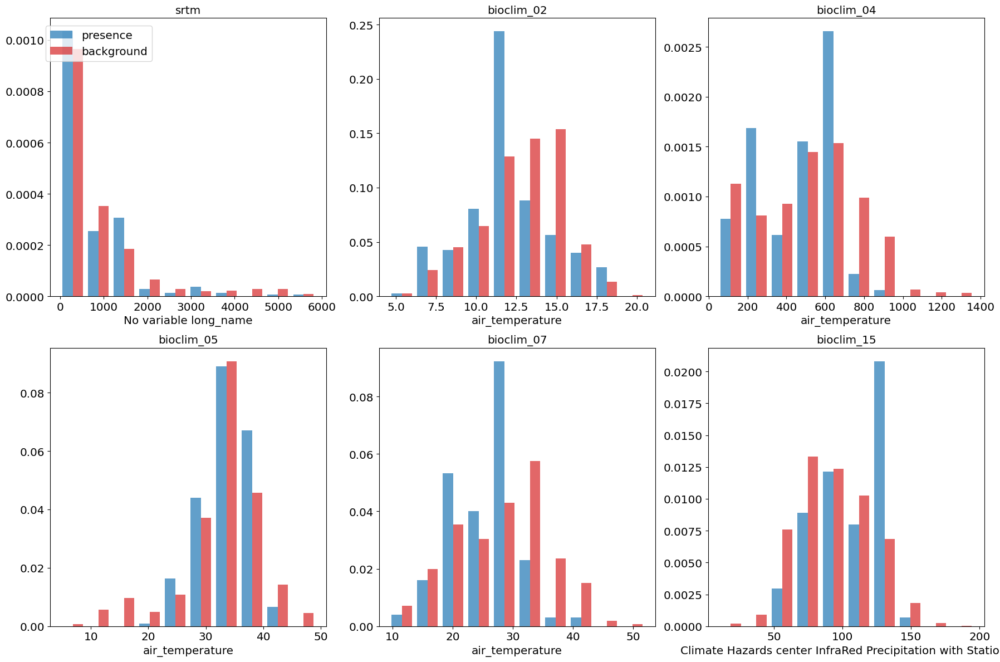

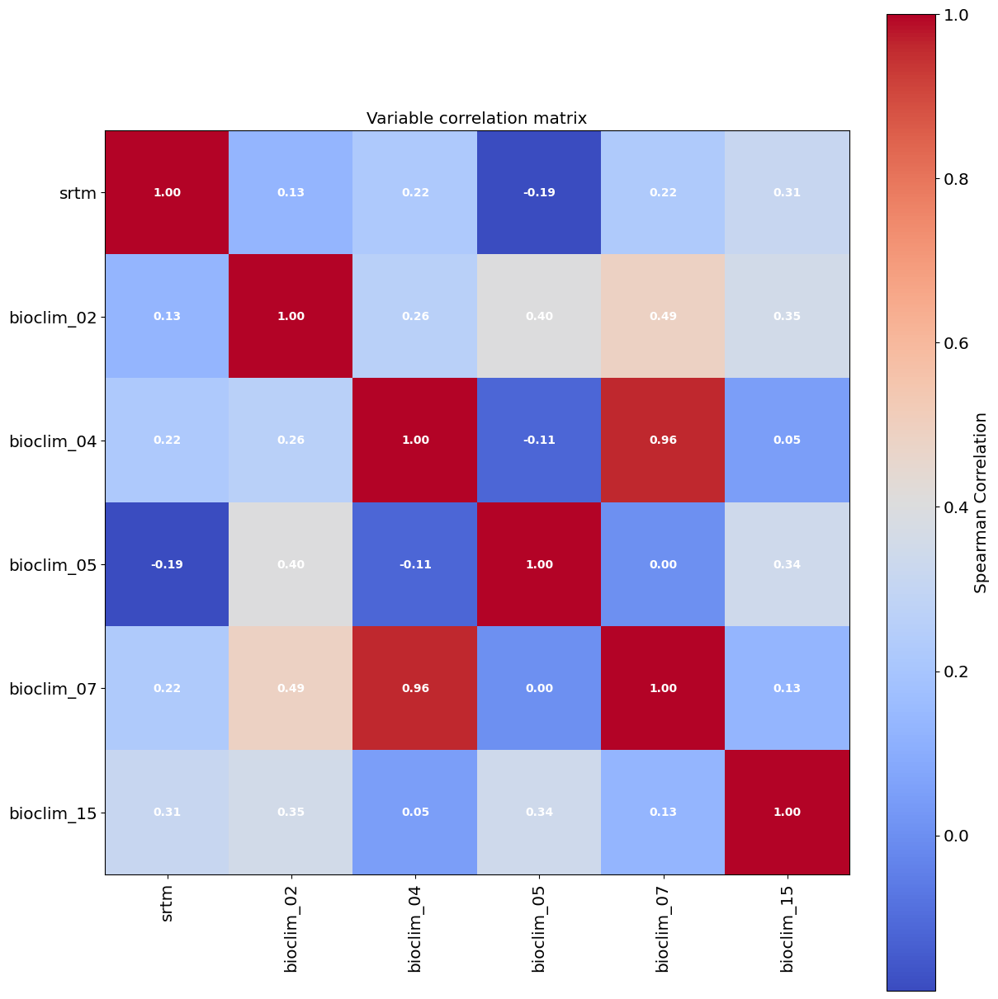

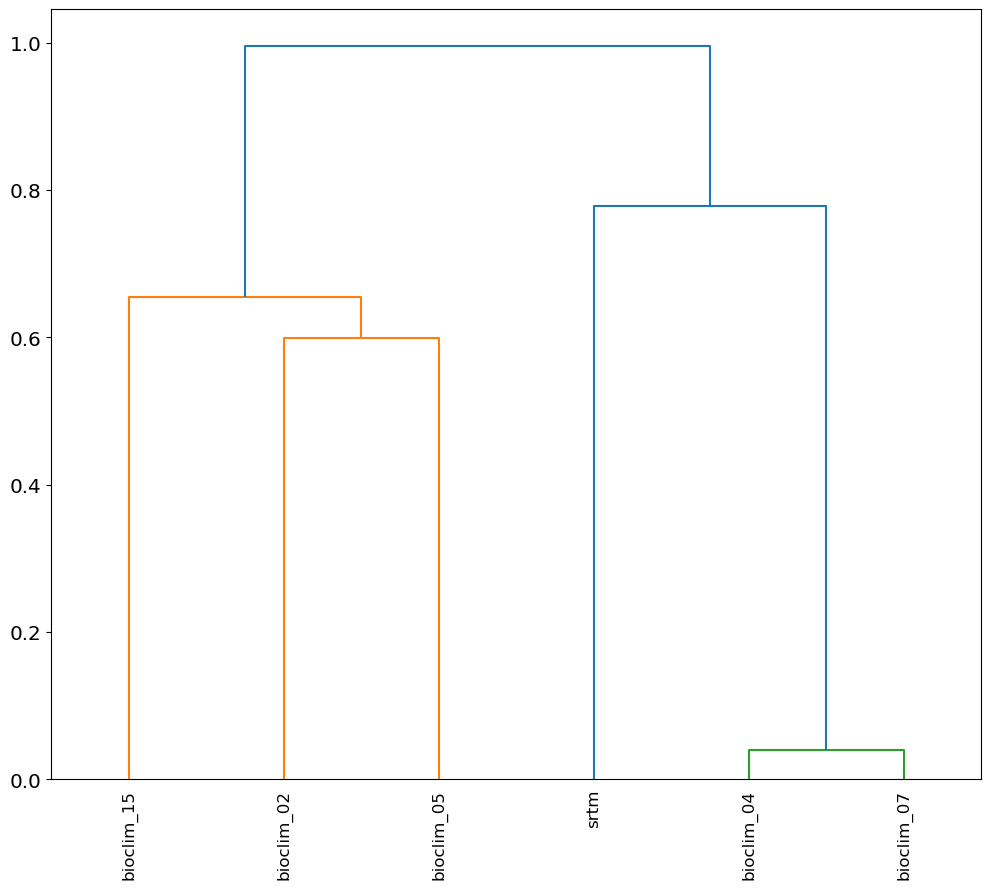

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Sample:   0%|                              | 0/379 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

1.3 Run Model
{'beta_categorical': 1.0, 'beta_hinge': 1.0, 'beta_lqp': 1.0, 'beta_multiplier': 1.5, 'beta_threshold': 1.0, 'clamp': True, 'class_weights': 100, 'convergence_tolerance': 2e-06, 'feature_types': ['linear', 'hinge', 'product'], 'n_cpus': 32, 'n_hinge_features': 10, 'n_lambdas': 100, 'n_threshold_features': 10, 'scorer': 'roc_auc', 'tau': 0.5, 'transform': 'logistic', 'use_lambdas': 'best', 'use_sklearn': True}
Training ROC-AUC score: 0.836
PR-AUC Score: 0.400
2.1 load test data


Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Sample:   0%|                              | 0/695 [00:00<?, ?it/s]

Raster:   0%|                              | 0/6 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

Sample:   0%|                              | 0/10000 [00:00<?, ?it/s]

2.2 model predict for region of interest/ test data
[0.07789977 0.14940258 0.1443152  ... 0.7518251  0.19790514 0.13387078]
2.3 test data performance
Training ROC-AUC score: 0.836
Training PR-AUC Score: 0.400
Test ROC-AUC score: 0.479
Test PR-AUC Score: 0.070


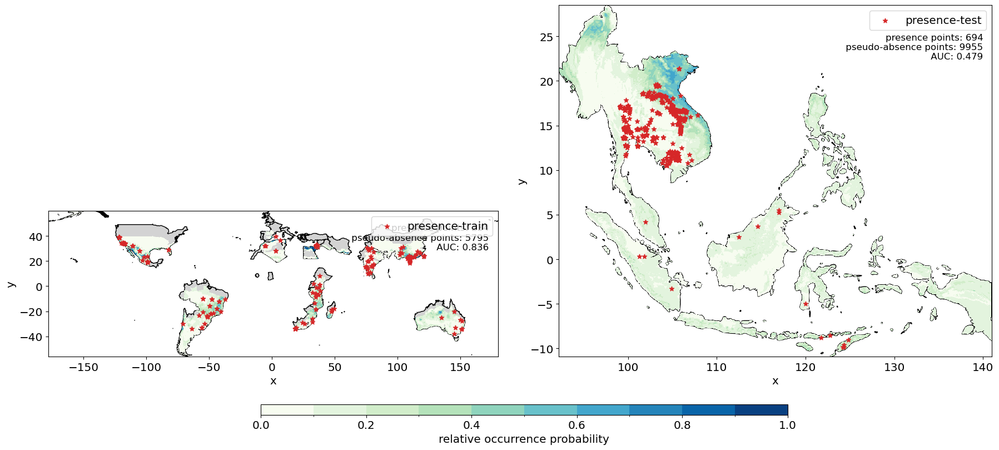

Training ROC-AUC score: 0.836
PR-AUC Score: 0.400


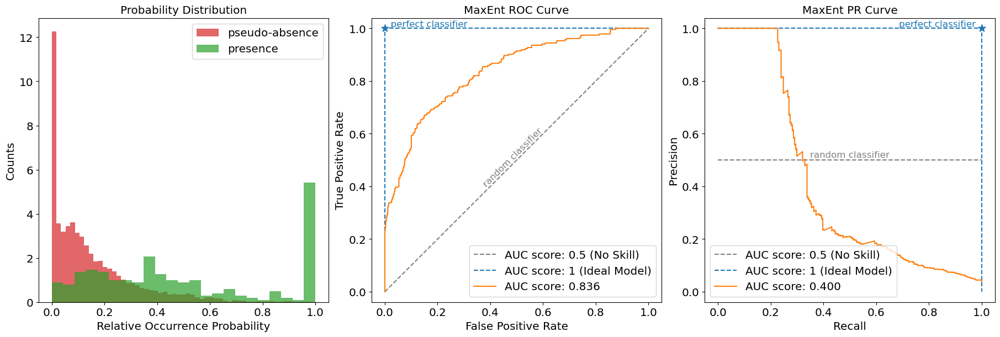

Training ROC-AUC score: 0.836
Test ROC-AUC score: 0.441
Training PR-AUC Score: 0.400
Test PR-AUC Score: 0.061


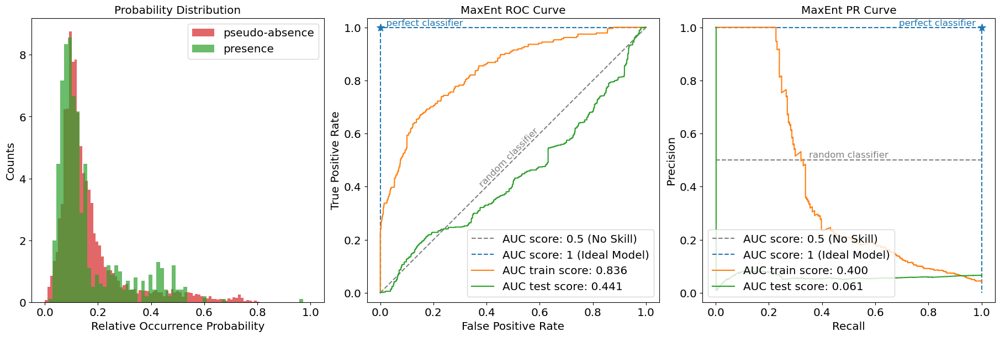

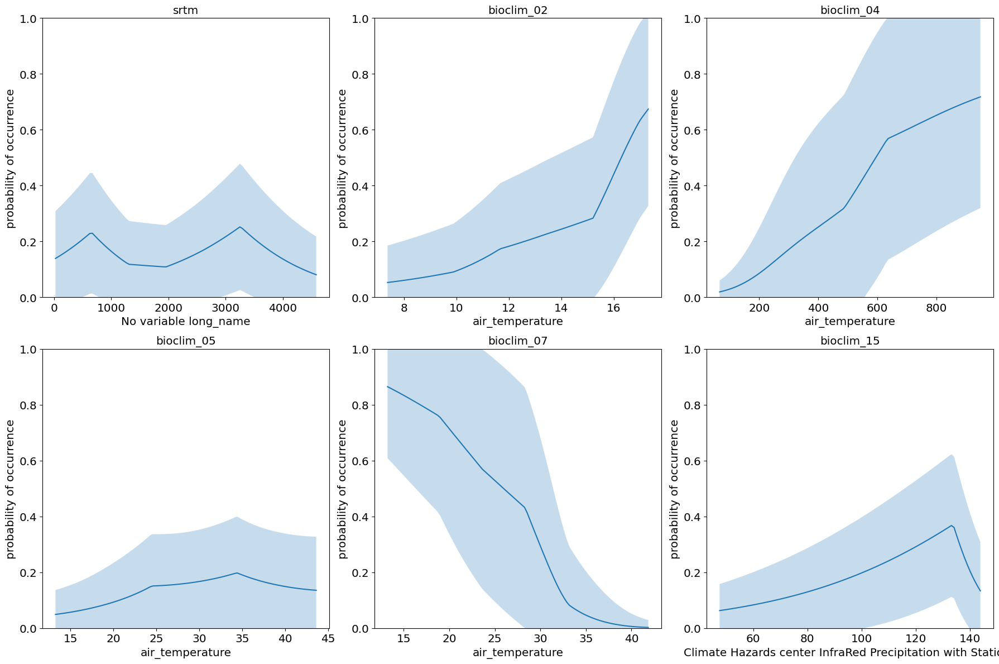

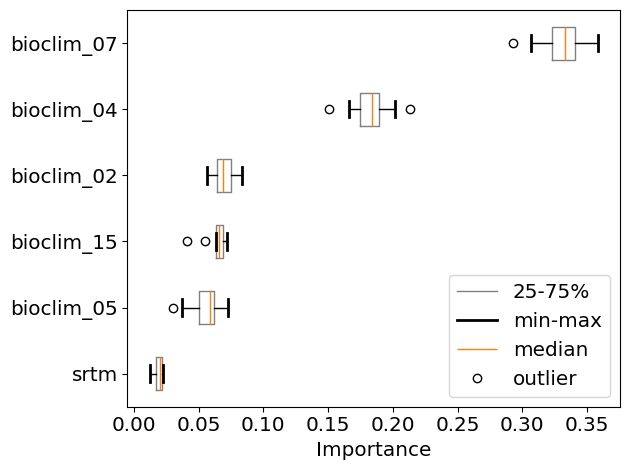

In [20]:
training = region_train 

Set1 = [i for i in range(1,20)]
Set2 = [2,11,13,15]
Set3 = [1,6,16]
Set4 = [16, 17, 10, 11, 9]
Set5 = [18, 19, 8, 4, 1]
Set6 = [2, 4, 5, 7, 15]
# bioclim_model = [i for i in range(1,20)] # [1, 5, 6, 12, 13, 14] # [1, 16, 6, 11] # [10, 16, 14] # [1,2,6,11,13,15,16] #

####--------------------------------------------------------------
bio1 = "Set1"
bioclim = Set1
%run '04_variable-statistics.ipynb'
bioclim_model = Set1
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

# ####--------------------------------------------------------------
training = region_train 
bioclim = Set2
bio1 = "Set2"
%run '04_variable-statistics.ipynb' 
bioclim_model = Set2
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

# ####--------------------------------------------------------------
training = region_train 
bioclim = Set3
bio1 = "Set3"
%run '04_variable-statistics.ipynb' 
bioclim_model = Set3
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

# ####--------------------------------------------------------------
training = region_train 
bioclim = Set4
bio1 = "Set4"
%run '04_variable-statistics.ipynb' 
bioclim_model = Set4
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

# ####--------------------------------------------------------------
training = region_train 
bioclim = Set5
bio1 = "Set5"
%run '04_variable-statistics.ipynb' 
bioclim_model = Set5
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

# ####--------------------------------------------------------------
training = region_train 
bioclim = Set6
bio1 = "Set6"
%run '04_variable-statistics.ipynb' 
bioclim_model = Set6
%run '05_run-model.ipynb'
    
%run '06_model-evaluation.ipynb'

In [ ]:
print("end"
client.close()